## Project Title: Regression Project (Store Sales - Time Series Forecasting)

## Description 

The goal of this project is to build a time series forecasting model that accurately predicts the unit sales for thousands of items sold at different Favorita stores. The training data includes dates, store, and product information, whether the item was being promoted, as well as the sales numbers, and there are additional files with supplementary information which inlcudes (transactions, stores and oil) which would be used for our modelling.

To achieve this goal, we will follow a few steps. First, we will explore and clean the data, including checking for missing values and outliers, and transforming the data if necessary. Then, we will split the data into training and validation sets to evaluate the performance of the model.

We would also fomulate a hypothesis and answer some business questions.


### Hypothesis

Null: The holiday type and locale have an impact on sales for stores, and there is a correlation between the price of oil and sales.
Alternate: The holiday type and locale have an impact on sales for stores, and there is no correlation between the price of oil and sales.

## BUSINESS QUESTIONS

1. Is the train dataset complete (has all the required dates)?

2. Which dates have the lowest and highest sales for each year?

3. Did the earthquake impact sales?

4. Are certain groups of stores selling more products? (Cluster, city, state, type)

5. Are sales affected by promotions, oil prices and holidays?

6. What analysis can we get from the date and its extractable features?

7. What is the difference between RMSLE, RMSE, MSE (or why is the MAE greater than all of them?)

#### ADDITIONAL QUESTION
8. Is there a significant difference in sales during holidays versus non-holidays?
9. Do stores located in certain locales have higher holiday sales compared to others?
10. Do stores in certain cities or states have higher sales compared to others?
11. Is there a difference in transactions during holidays versus non-holidays?
12. Does the promotion of certain items during holidays impact sales?

Set Up

Installing some of the neccessary libraries

In [338]:
!pip install pmdarima


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [339]:
!pip install category_encoders


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Importing Libraries

In [340]:
import numpy as np
import pandas as pd
import matplotlib
from datetime import datetime
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import interpolate
import os, pickle
import sklearn
from sklearn.linear_model import LinearRegression
import datetime
from sklearn.model_selection import GridSearchCV
import warnings
import statsmodels.api as sm
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.api import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.correlation_tools import corr_nearest
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
import pmdarima
from pmdarima import auto_arima
import category_encoders as ce
from google.colab import files
import io
from google.colab import drive
from sklearn.model_selection import train_test_split


plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})
warnings.filterwarnings("ignore")


%matplotlib inline

In [341]:

drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Loading The Datasets 

In [342]:

train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/regression/train.csv')

holidays = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/regression/holidays_events.csv')
stores = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/regression/stores.csv')
test = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/regression/test.csv')
oil = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/regression/oil.csv')
transactions = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/regression/transactions.csv')


In [343]:
#uploaded = files.upload()


## Exploratory Data Analysis On The Loaded Datasets

## Holidays Dataset

In [344]:
holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [345]:
# checking  the information of the dataset
holidays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         350 non-null    object
 1   type         350 non-null    object
 2   locale       350 non-null    object
 3   locale_name  350 non-null    object
 4   description  350 non-null    object
 5   transferred  350 non-null    bool  
dtypes: bool(1), object(5)
memory usage: 14.1+ KB


In [346]:
# deep diving on the "transferred column"
print(holidays["transferred"])

0      False
1      False
2      False
3      False
4      False
5      False
6      False
7      False
8      False
9      False
10     False
11     False
12     False
13     False
14     False
15     False
16     False
17     False
18     False
19      True
20     False
21     False
22     False
23     False
24     False
25     False
26     False
27     False
28     False
29     False
30     False
31     False
32     False
33     False
34     False
35     False
36     False
37     False
38     False
39     False
40     False
41     False
42     False
43     False
44     False
45     False
46     False
47     False
48     False
49     False
50     False
51     False
52     False
53     False
54     False
55     False
56     False
57     False
58     False
59     False
60     False
61     False
62     False
63     False
64     False
65     False
66     False
67     False
68     False
69     False
70     False
71     False
72      True
73     False
74     False
75     False
76     False

The date column is recorded as object. This will be changed to the date format. There are no null values in the data.

In [347]:
# check for duplicates

holidays.duplicated().any()

False

There are no duplicated values in the holidays dataset

In [348]:
# checking unique values 

holidays.nunique()

date           312
type             6
locale           3
locale_name     24
description    103
transferred      2
dtype: int64

There are 6 types of holidays and 2 forms of holidays transfers

In [349]:
# Checking the different types of holidays

list(holidays.type.unique())

['Holiday', 'Transfer', 'Additional', 'Bridge', 'Work Day', 'Event']

In [350]:
## check for null values

holidays.isnull().any()

date           False
type           False
locale         False
locale_name    False
description    False
transferred    False
dtype: bool

There are no Null entries in the holidays dataset

In [351]:
# check the descriptive statistics of the dataset

holidays.describe(include="all")
#.transpose()

,date,type,locale,locale_name,description,transferred
count,350,350,350,350,350,350
unique,312,6,3,24,103,2
top,2014-06-25,Holiday,National,Ecuador,Carnaval,False
freq,4,221,174,174,10,338


## Oil Dataset

In [352]:
oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [353]:
oil.shape

(1218, 2)

The oil dataset contains 1218 rows and 2 columns

In [354]:
#checking the basic information about the oil dataset
oil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        1218 non-null   object 
 1   dcoilwtico  1175 non-null   float64
dtypes: float64(1), object(1)
memory usage: 19.2+ KB


The date is in object format. It must corrected to date format. There are null 

In [355]:
# checking for null values
oil.isnull().sum()

date           0
dcoilwtico    43
dtype: int64

In [356]:
#checking datatypes of each column in the dataset
oil.dtypes

date           object
dcoilwtico    float64
dtype: object

There are 43 null values in the oil data. Since this a crude oil price,, there is no possibilty that crude oil price will 0. Hence, we will compute it with the mean

In [357]:
#checking for duplicates 
oil.duplicated().sum()

0

There are no duplicated values in the oil data

In [358]:
# deep dive on the d column
pd.set_option('display.max_rows', None, "display.max_columns", None)
oil["dcoilwtico"]

0          NaN
1        93.14
2        92.97
3        93.12
4        93.20
5        93.21
6        93.08
7        93.81
8        93.60
9        94.27
10       93.26
11       94.28
12       95.49
13       95.61
14         NaN
15       96.09
16       95.06
17       95.35
18       95.15
19       95.95
20       97.62
21       97.98
22       97.65
23       97.46
24       96.21
25       96.68
26       96.44
27       95.84
28       95.71
29       97.01
30       97.48
31       97.03
32       97.30
33       95.95
34         NaN
35       96.69
36       94.92
37       92.79
38       93.12
39       92.74
40       92.63
41       92.84
42       92.03
43       90.71
44       90.13
45       90.88
46       90.47
47       91.53
48       92.01
49       92.07
50       92.44
51       92.47
52       93.03
53       93.49
54       93.71
55       92.44
56       93.21
57       92.46
58       93.41
59       94.55
60       95.99
61       96.53
62       97.24
63         NaN
64       97.10
65       97.23
66       9

In [359]:
#checking the description of the dataset
oil.describe(include="all").transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
date,1218,1218,2013-01-01,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dcoilwtico,1175.0,NaN,NaN,NaN,67.714366,25.630476,26.19,46.405,53.19,95.66,110.62


## Transactions Dataset

In [360]:
#checking the head of the dataset
transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [361]:
#checking the datatypes
transactions.dtypes


date            object
store_nbr        int64
transactions     int64
dtype: object

In [362]:
#checking the info of the dataset
transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          83488 non-null  object
 1   store_nbr     83488 non-null  int64 
 2   transactions  83488 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 1.9+ MB


In [363]:
#checking for null values
transactions.isnull().any()

date            False
store_nbr       False
transactions    False
dtype: bool

In [364]:
#checking the description of the dataset
transactions.describe(include="all").transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
date,83488,1682,2017-08-15,54,NaN,NaN,NaN,NaN,NaN,NaN,NaN
store_nbr,83488.0,NaN,NaN,NaN,26.939237,15.608204,1.0,13.0,27.0,40.0,54.0
transactions,83488.0,NaN,NaN,NaN,1694.602158,963.286644,5.0,1046.0,1393.0,2079.0,8359.0


In [365]:
#checking for duplicated values
transactions.duplicated().sum()

0

In [366]:
#checking for unique values
transactions.nunique()

date            1682
store_nbr         54
transactions    4993
dtype: int64

### Stores Dataset

In [367]:
#checking the datatypes
stores.dtypes


store_nbr     int64
city         object
state        object
type         object
cluster       int64
dtype: object

In [368]:
#checking the number of rows and columns
stores.shape

(54, 5)

There are 54 rows and 5 columns in the stores dataset

In [369]:
#checking the head of the dataset
stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [370]:
#checking the info of the dataset
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [371]:
#checking for null values 
stores.isnull().any() 

store_nbr    False
city         False
state        False
type         False
cluster      False
dtype: bool

There are no null entries in the stores data

In [372]:
#checking for duplicates 
stores. duplicated().sum()

0

In [373]:
# Checking for unique values in the stores data

stores.nunique()

store_nbr    54
city         22
state        16
type          5
cluster      17
dtype: int64

Stores are located at 22 different Cities in 16 States. There are 5 different types of stores.There are 17 similar stores located in these cities.

There are no duplicated entries in the stores data

## Test Dataset

In [374]:
# Checking the head and tail of the test data

test

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0
5,3000893,2017-08-16,1,BREAD/BAKERY,12
6,3000894,2017-08-16,1,CELEBRATION,0
7,3000895,2017-08-16,1,CLEANING,25
8,3000896,2017-08-16,1,DAIRY,45
9,3000897,2017-08-16,1,DELI,18


In [375]:
#checking the number of rows and columns
test.shape

(28512, 5)

There are 2852 rows and 5 columns. It is noted that the sales column has been removed form the test data

In [376]:
#checking the info of the dataset
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           28512 non-null  int64 
 1   date         28512 non-null  object
 2   store_nbr    28512 non-null  int64 
 3   family       28512 non-null  object
 4   onpromotion  28512 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 1.1+ MB


There are no null values, the date column is recorded as an object.

In [377]:
#checking for duplicated values
test.duplicated().sum()

0

There are no duplicated values in the test dataset


In [378]:
# Checking for unique values in the test data

test.nunique()

id             28512
date              16
store_nbr         54
family            33
onpromotion      212
dtype: int64

There are 16 days recorded, 54 stores and 33 different product families

### Stores Dataset


In [379]:
# Checking the head  of the stores data

stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [380]:
# Checking the shape of the stores data

stores.shape

(54, 5)

There are 54 rows and 5 columns in the stores dataset

In [381]:
# Checking the basic info of the stores data

stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


There are no null entries in the stores dataset

In [382]:
# Checking for duplicate entries in the stores data

stores.duplicated().any()

False

There are no duplicated entries in the stores dataset


In [383]:
# Checking for unique values in the stores data
stores.nunique()

store_nbr    54
city         22
state        16
type          5
cluster      17
dtype: int64

Stores are located at 22 different Cities in 16 States. There are 5 different types of stores.There are 17 similar stores located in these cities.

## Train Dataset

In [384]:
#checking the head of the dataset
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [385]:
# Checking the size of the train dataset

train.shape

(3000888, 6)

The train dataset has 3000888 rows and 6 colums

In [386]:
# Checking the basic info of the train dataset

train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


The date column is recorded as object. It has to be converted to date format

In [387]:
# Checking for null values in the train data

train.isnull().any()

id             False
date           False
store_nbr      False
family         False
sales          False
onpromotion    False
dtype: bool

 There are no null values in the train dataset

In [388]:
#checking for duplicate values
train.duplicated().sum()

0

There are no duplicated values in the train dataset

In [389]:
# Checking the basic statistics of the train data

train.describe(include="all").transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,3000888.0,NaN,NaN,NaN,1500443.5,866281.891642,0.0,750221.75,1500443.5,2250665.25,3000887.0
date,3000888,1684,2013-01-01,1782,NaN,NaN,NaN,NaN,NaN,NaN,NaN
store_nbr,3000888.0,NaN,NaN,NaN,27.5,15.585787,1.0,14.0,27.5,41.0,54.0
family,3000888,33,AUTOMOTIVE,90936,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sales,3000888.0,NaN,NaN,NaN,357.775749,1101.997721,0.0,0.0,11.0,195.84725,124717.0
onpromotion,3000888.0,NaN,NaN,NaN,2.60277,12.218882,0.0,0.0,0.0,0.0,741.0


There are 33 different categories of grocery products. Automotive family has the most number of products.<br />Also, there are 54 stores in the data

## Univariate Analysis

### Train Dataset

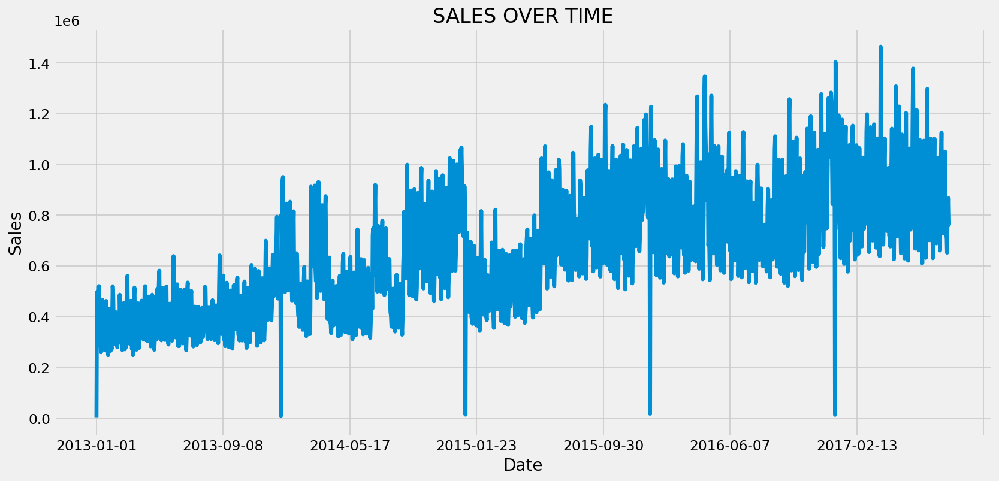

In [390]:
# Visually exploring sales over time

sales_time = train.groupby("date").sales.sum().reset_index()
sales_time = sales_time.set_index("date")

sales_time.plot(legend=False, figsize=(15, 7))
plt.title("SALES OVER TIME")
plt.ylabel("Sales")
plt.xlabel("Date")
plt.style.use("fivethirtyeight")
plt.show()

From the above grapgh one can conclude that, there is an increasing sales trend from year to year.

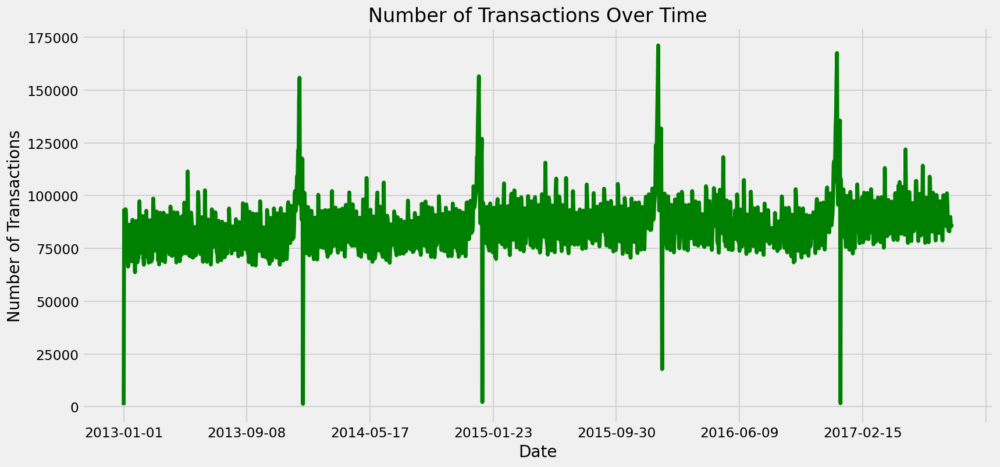

In [391]:
# Visually Exploring Trannsactions By Date

transactions_date = transactions.groupby('date').transactions.sum().reset_index()
transactions_date = transactions_date.set_index("date")

transactions_date.plot(legend=False, color="green", figsize=(15, 7))
plt.title('Number of Transactions Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Transactions')
plt.style.use("fivethirtyeight")
plt.show()

Transactions were stationary throughout the recorded years. With the exception, however, the ends of the years witness sharp increases in transactions showing seasonality.

## Oil Data

In [392]:
oil.describe()

,dcoilwtico
count,1175.000000
mean,67.714366
std,25.630476
min,26.190000
25%,46.405000
50%,53.190000
75%,95.660000
max,110.620000


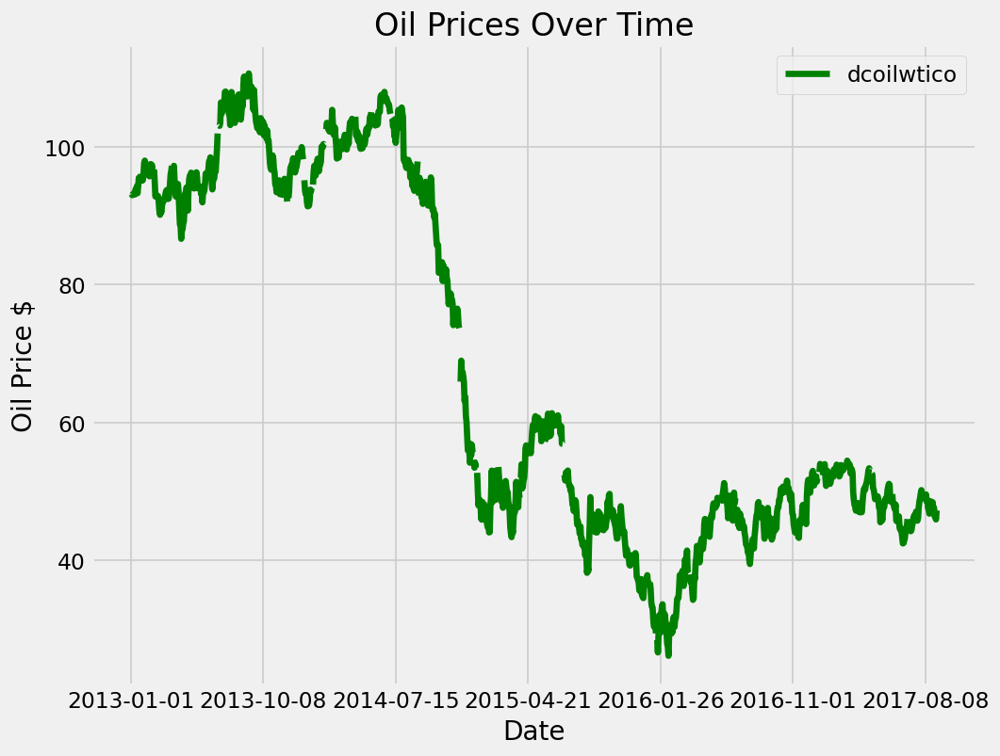

In [393]:
# oil prices overtime
oil.plot(x='date', y='dcoilwtico', color='green')
plt.title('Oil Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Oil Price $')
plt.show()

The image above shows an trends of increment in oil prices between 2013 and 2014 above $ 100,
with prices dropping between 2015 and 2017 with the lowest being around $ 25 in 2016.

The histogram plot shows the distribution of the values in the 'dcoilwtico' column and the frequency of the values within each bin. This plot can help to identify the most common oil prices and the range of oil prices in the dataset.






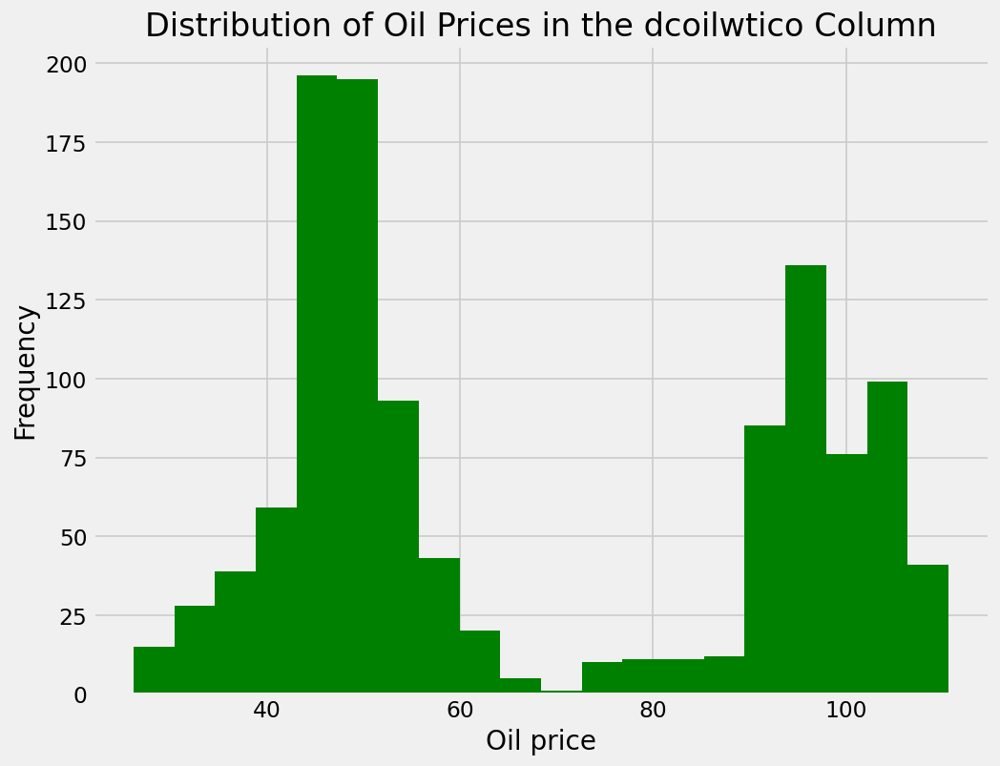

In [394]:
plt.hist(oil['dcoilwtico'], bins=20, color='green')
plt.title("Distribution of Oil Prices in the dcoilwtico Column")
plt.xlabel('Oil price')
plt.ylabel('Frequency')
plt.show()


From the line plot, one  can identify that, the most common oil price being around $ 45 occuring around 190 times with a price of about $ 70 recording the lowest occurence.

## Stores Data

In [395]:
#Set store number as index  
stores.set_index("store_nbr").head()

,city,state,type,cluster
store_nbr,,,,
1,Quito,Pichincha,D,13
2,Quito,Pichincha,D,13
3,Quito,Pichincha,D,8
4,Quito,Pichincha,D,9
5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [396]:
stores.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
store_nbr,54.0,NaN,NaN,NaN,27.5,15.732133,1.0,14.25,27.5,40.75,54.0
city,54,22,Quito,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
state,54,16,Pichincha,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN
type,54,5,D,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cluster,54.0,NaN,NaN,NaN,8.481481,4.693395,1.0,4.0,8.5,13.0,17.0


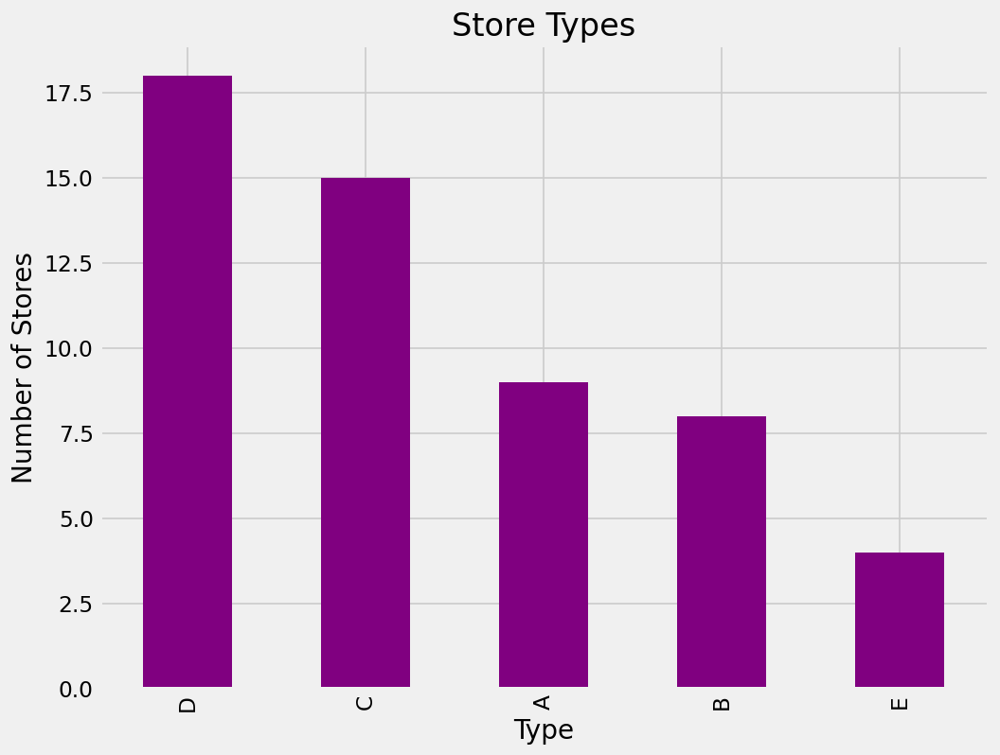

In [397]:
#store types and total numbers
store_types= stores['type'].value_counts()
store_types.plot(kind='bar', color='purple')
plt.title('Store Types')
plt.xlabel('Type')
plt.ylabel('Number of Stores')
plt.show()

From the chart, Stores category "D" has the largest number of chains, followed by categories "C, A, B" with category "E" having the lowest number of stores chains.

### Transactions Dataset

In [398]:
transactions.describe(include="all")

,date,store_nbr,transactions
count,83488,83488.000000,83488.000000
unique,1682,NaN,NaN
top,2017-08-15,NaN,NaN
freq,54,NaN,NaN
mean,NaN,26.939237,1694.602158
std,NaN,15.608204,963.286644
min,NaN,1.000000,5.000000
25%,NaN,13.000000,1046.000000
50%,NaN,27.000000,1393.000000
75%,NaN,40.000000,2079.000000


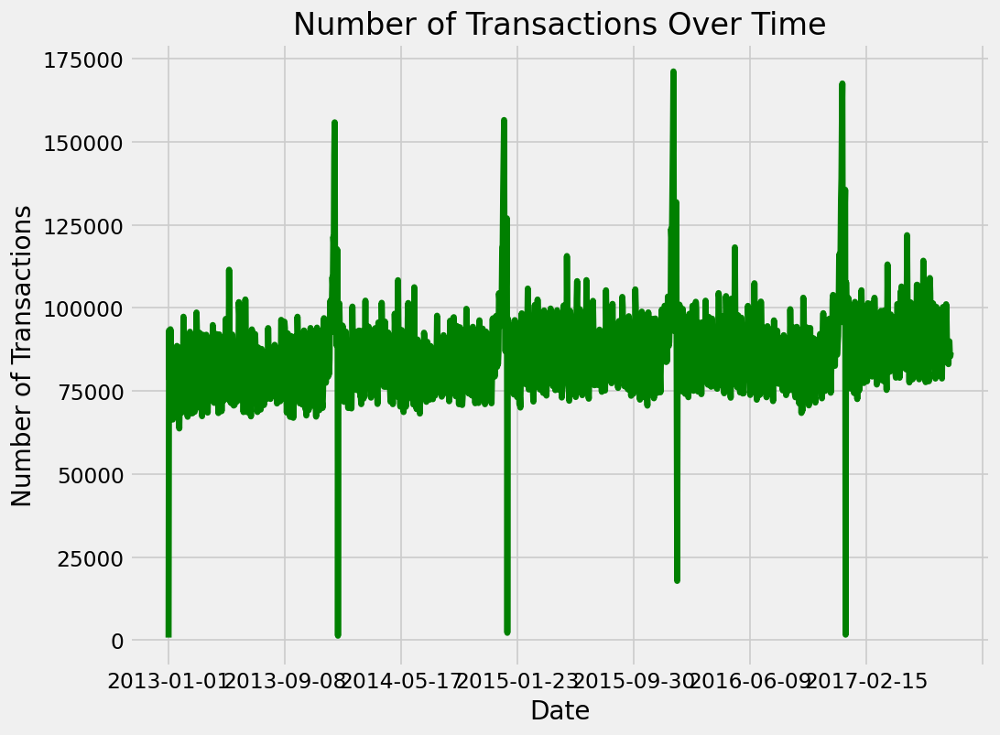

In [399]:
#Number of transaction over time
transactions_by_date = transactions.groupby('date').sum()['transactions']
transactions_by_date.plot(color='green')
plt.title('Number of Transactions Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Transactions')
plt.show()

Transactions were stationary throughout the recorded years. With seasonal hikes in prices towards the end of the year.

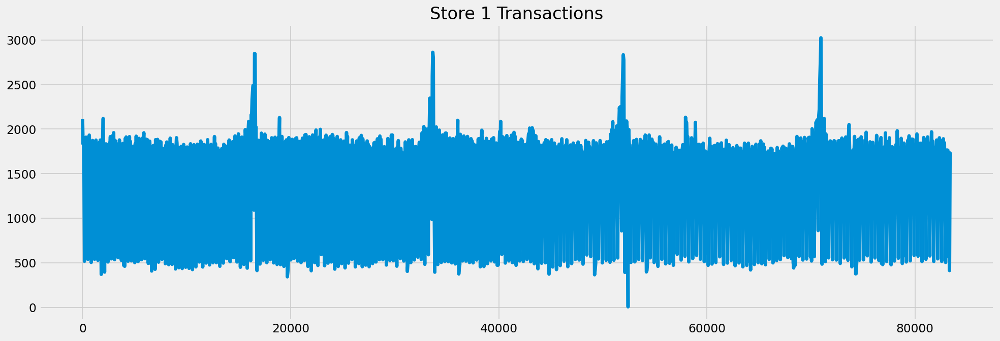

In [400]:
subset = transactions[transactions['store_nbr'] == 1]

plt.figure(figsize=[18, 6])
plt.title('Store 1 Transactions')
plt.plot(subset['transactions'])
plt.show()

## Holidays Data

In [401]:
holidays.describe(include='all')

,date,type,locale,locale_name,description,transferred
count,350,350,350,350,350,350
unique,312,6,3,24,103,2
top,2014-06-25,Holiday,National,Ecuador,Carnaval,False
freq,4,221,174,174,10,338


In [402]:
# Checking holidays that were transferred

holidays[holidays.transferred == True]

,date,type,locale,locale_name,description,transferred
19,2012-10-09,Holiday,National,Ecuador,Independencia de Guayaquil,True
72,2013-10-09,Holiday,National,Ecuador,Independencia de Guayaquil,True
135,2014-10-09,Holiday,National,Ecuador,Independencia de Guayaquil,True
255,2016-05-24,Holiday,National,Ecuador,Batalla de Pichincha,True
266,2016-07-25,Holiday,Local,Guayaquil,Fundacion de Guayaquil,True
268,2016-08-10,Holiday,National,Ecuador,Primer Grito de Independencia,True
297,2017-01-01,Holiday,National,Ecuador,Primer dia del ano,True
303,2017-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,True
312,2017-05-24,Holiday,National,Ecuador,Batalla de Pichincha,True
324,2017-08-10,Holiday,National,Ecuador,Primer Grito de Independencia,True


In [403]:
# Checking the total number of holidays transfered.
holidays[holidays.transferred == True].value_counts().sum()

12

From the above we can see that, 12 holidays were transfered between 2012 - 2017

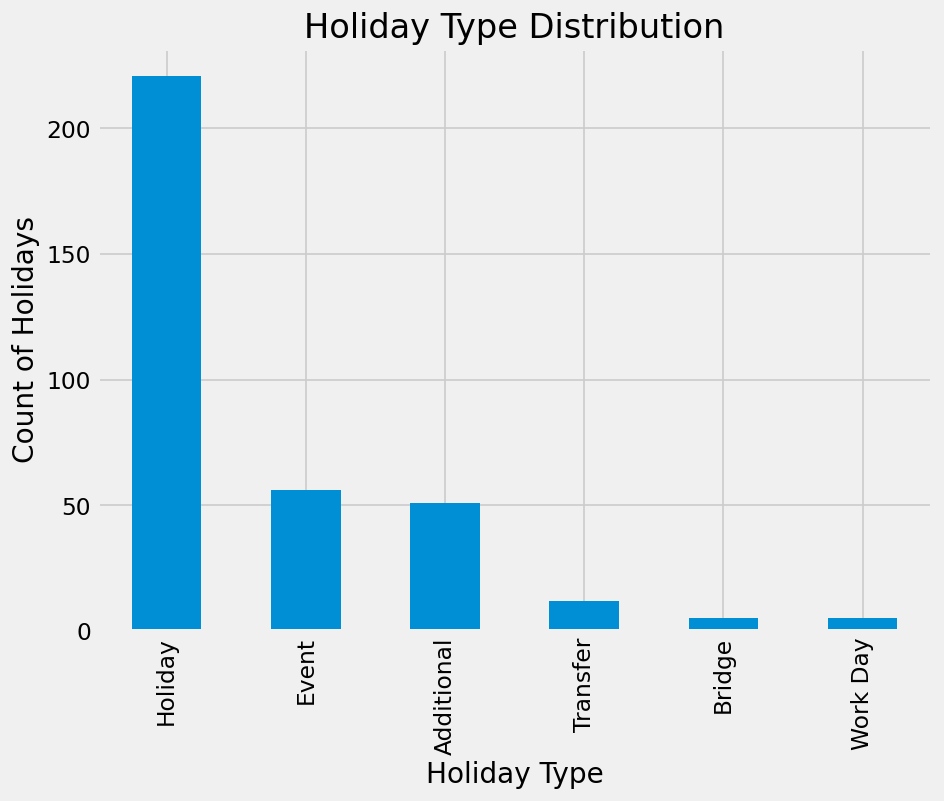

In [404]:
# plot the distribution of the "type" column
plt.figure(figsize=(8, 6))
holidays['type'].value_counts().plot(kind='bar')
plt.title('Holiday Type Distribution')
plt.xlabel('Holiday Type')
plt.ylabel('Count of Holidays')
plt.show()


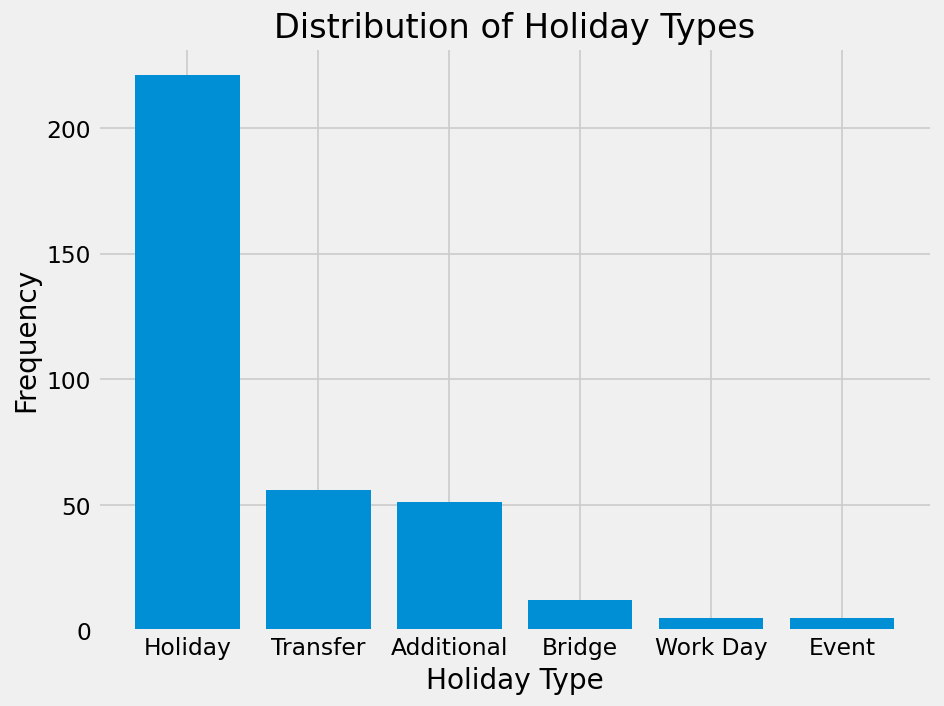

In [405]:
#Plot the 'type' column
plt.figure(figsize=(8, 6))
plt.bar(holidays['type'].unique(), holidays['type'].value_counts())
plt.xlabel('Holiday Type')
plt.ylabel('Frequency')
plt.title('Distribution of Holiday Types')
plt.show()



## Data Cleaning 

### Issues With The Datasets and How To Resolve Them

1. Apart from the stores data set which had no issues the “Date columns” in the rest of the datasets were defined as object and would be changed into datetime format. 

2. The 'dcoilwtico' column  in the oil dataset contains 'NaN' values and would replaced with the mean value. 

 

In [406]:
#Converting All Incorrect Date Formats To Datetime
oil['date'] = pd.to_datetime(oil['date'])
train['date'] = pd.to_datetime(train['date'])
holidays["date"] = pd.to_datetime(holidays.date)
transactions["date"] = pd.to_datetime(transactions.date)

In [407]:
# checking to see if the changes have been effected
oil.dtypes


date          datetime64[ns]
dcoilwtico           float64
dtype: object

In [408]:
train.dtypes


id                      int64
date           datetime64[ns]
store_nbr               int64
family                 object
sales                 float64
onpromotion             int64
dtype: object

In [409]:
holidays.dtypes


date           datetime64[ns]
type                   object
locale                 object
locale_name            object
description            object
transferred              bool
dtype: object

In [410]:
transactions.dtypes

date            datetime64[ns]
store_nbr                int64
transactions             int64
dtype: object

In [411]:
# filling the NaN values with mean
mean = oil.mean()
mean


dcoilwtico    67.714366
dtype: float64

In [412]:
# filling the null values in the oil dataset with the mean value 
oil = oil.fillna(mean)

# Multivariate Analysis

### Oil Data

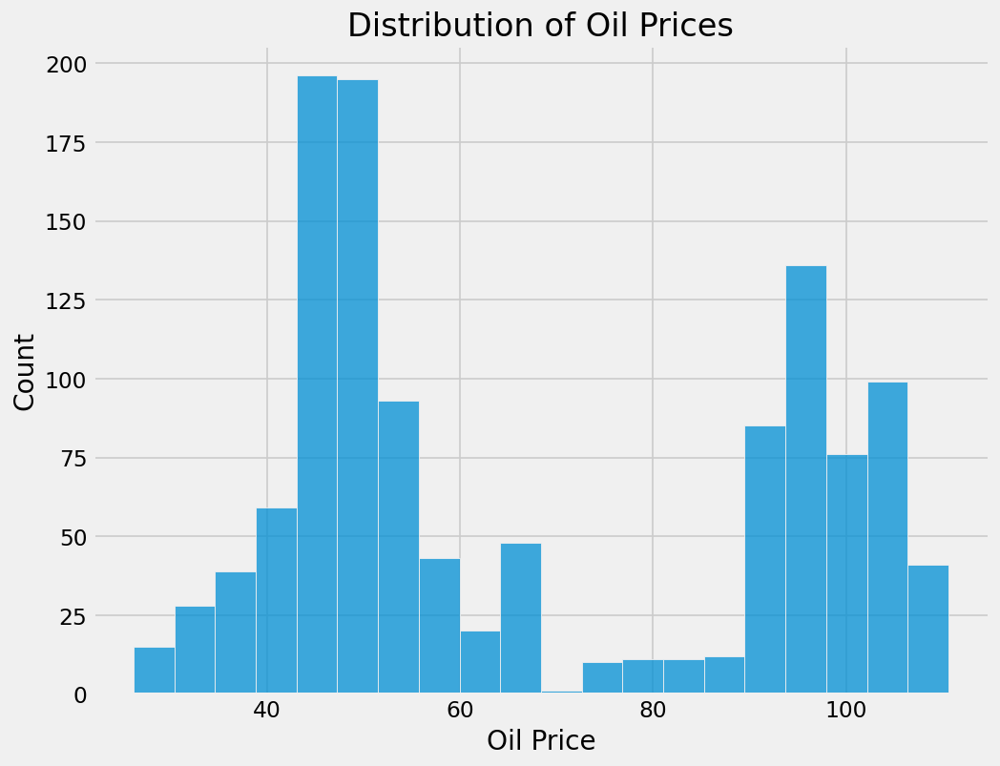

In [413]:
# Visualize the distribution of the oil prices using a histogram:
sns.histplot(data=oil, x="dcoilwtico", bins=20)
plt.xlabel('Oil Price')
plt.title('Distribution of Oil Prices')
plt.show()


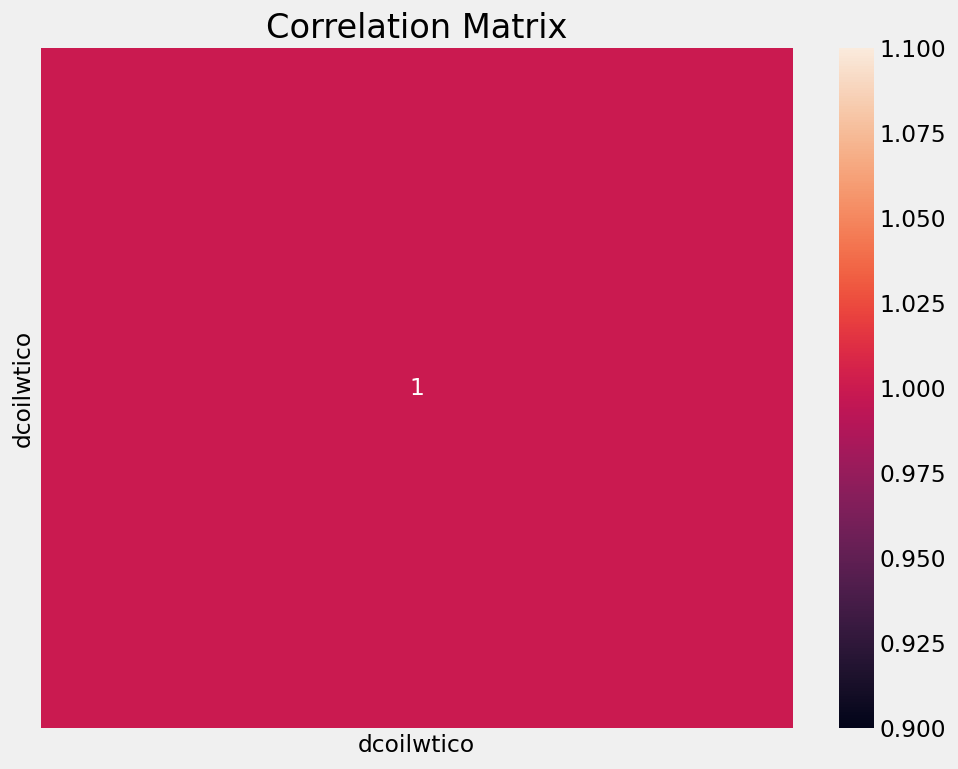

In [414]:
# Check the correlation between oil prices and other variables in the data (if applicable) using a correlation matrix:
corr = oil.corr()
sns.heatmap(corr, annot=True)
plt.title('Correlation Matrix')
plt.show()


In [415]:
#checking the relationship between transactions and oil prices 
merged_df = pd.merge(transactions, stores, on='store_nbr')
merged_df = pd.merge(merged_df, oil, on='date', how='left')


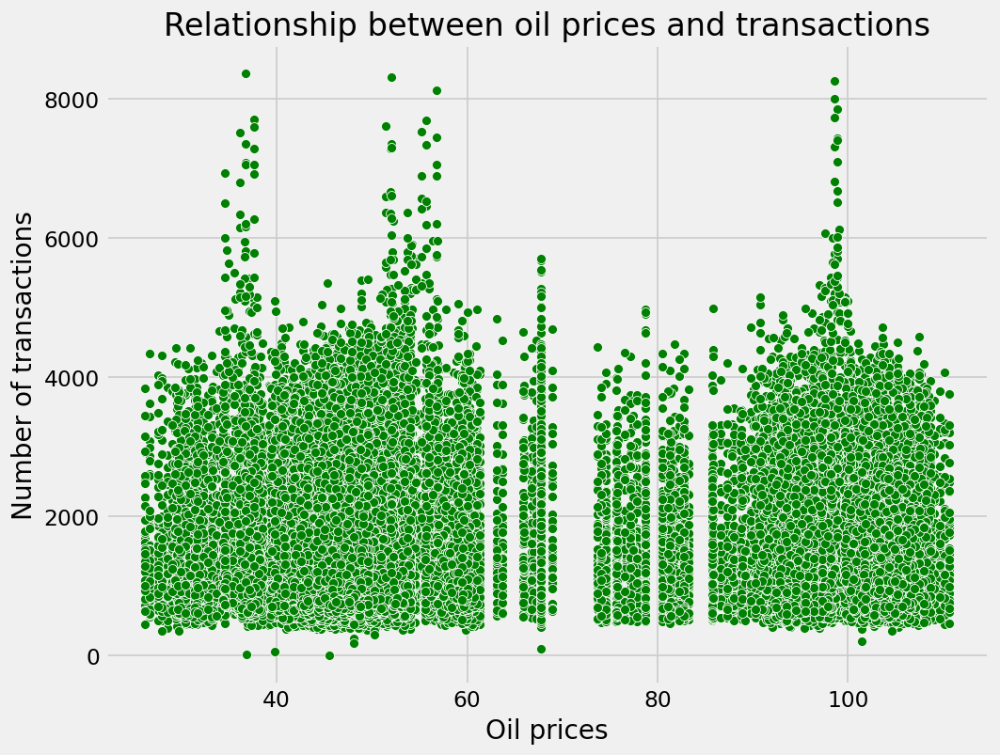

In [416]:
sns.scatterplot(x='dcoilwtico', y='transactions', data=merged_df, color='green')
plt.title('Relationship between oil prices and transactions')
plt.xlabel('Oil prices')
plt.ylabel('Number of transactions')
plt.show()

### Stores Data


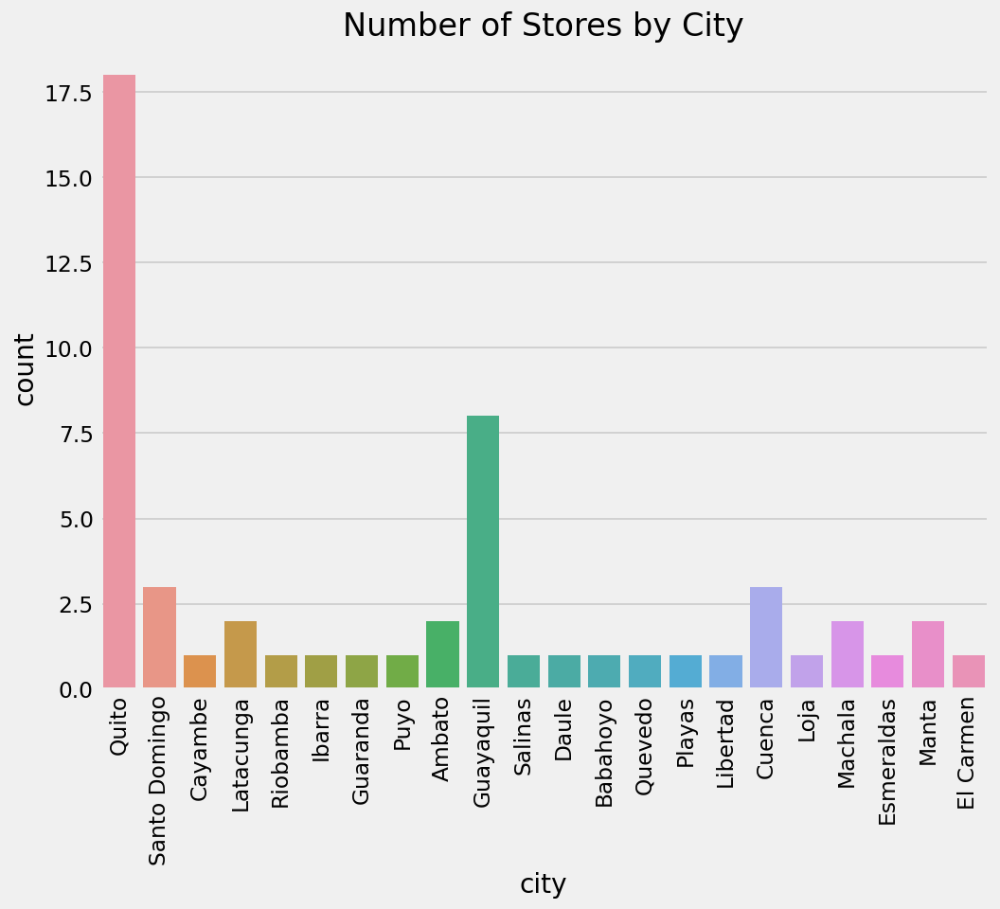

In [417]:
# Visualize the distribution of stores by city.
sns.countplot(data=stores, x='city')
plt.xticks(rotation=90)
plt.title('Number of Stores by City')
plt.show()



From the above plot one can notice that, Quito has the highest number of stores followed by Guayaquil.

In [418]:
# Visualize the distribution of stores by city.
#sns.countplot(data=stores, x='state')
#plt.title('Number of Stores by State')
#plt.show()



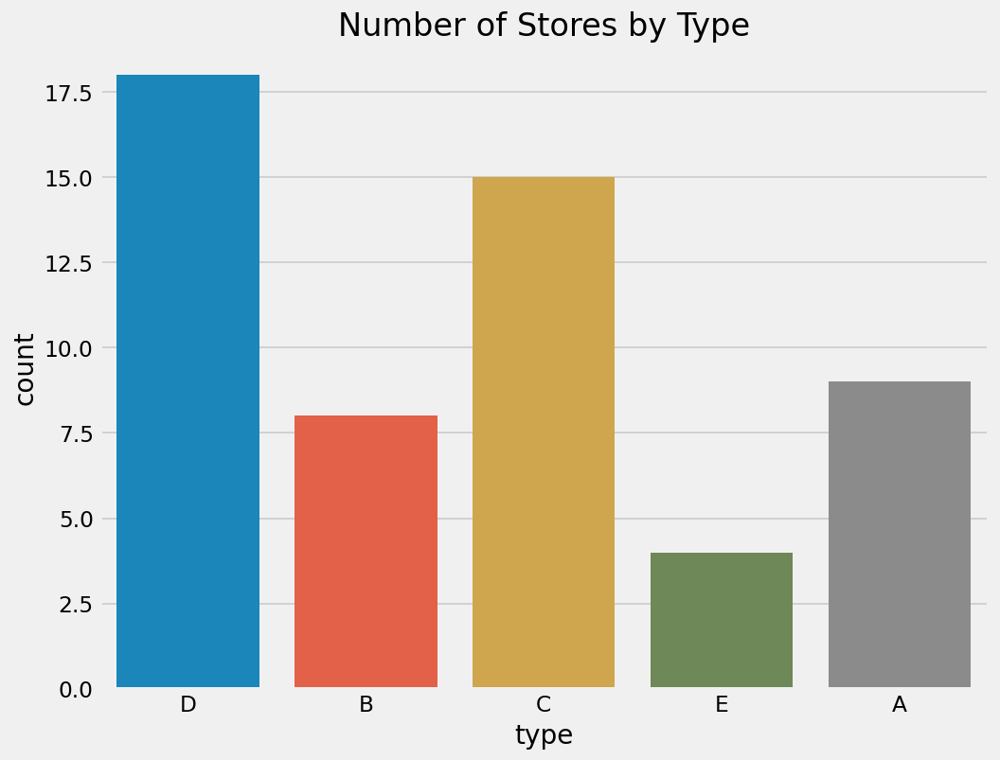

In [419]:
# Visualize the distribution of stores by city.
sns.countplot(data=stores, x='type')
plt.title('Number of Stores by Type')
plt.show()


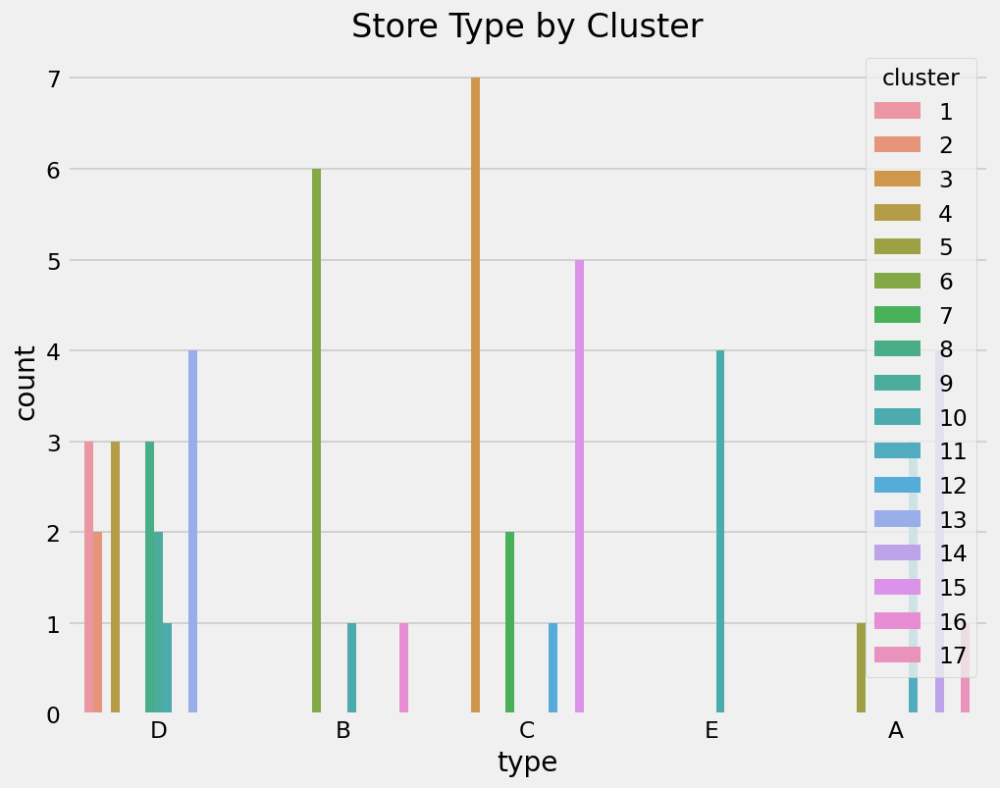

In [420]:
# Check the relationship between store type and cluster:
sns.countplot(data=stores, x='type', hue='cluster')
plt.title('Store Type by Cluster')
plt.show()


From the above, cluster 3 has the highest number of stores.

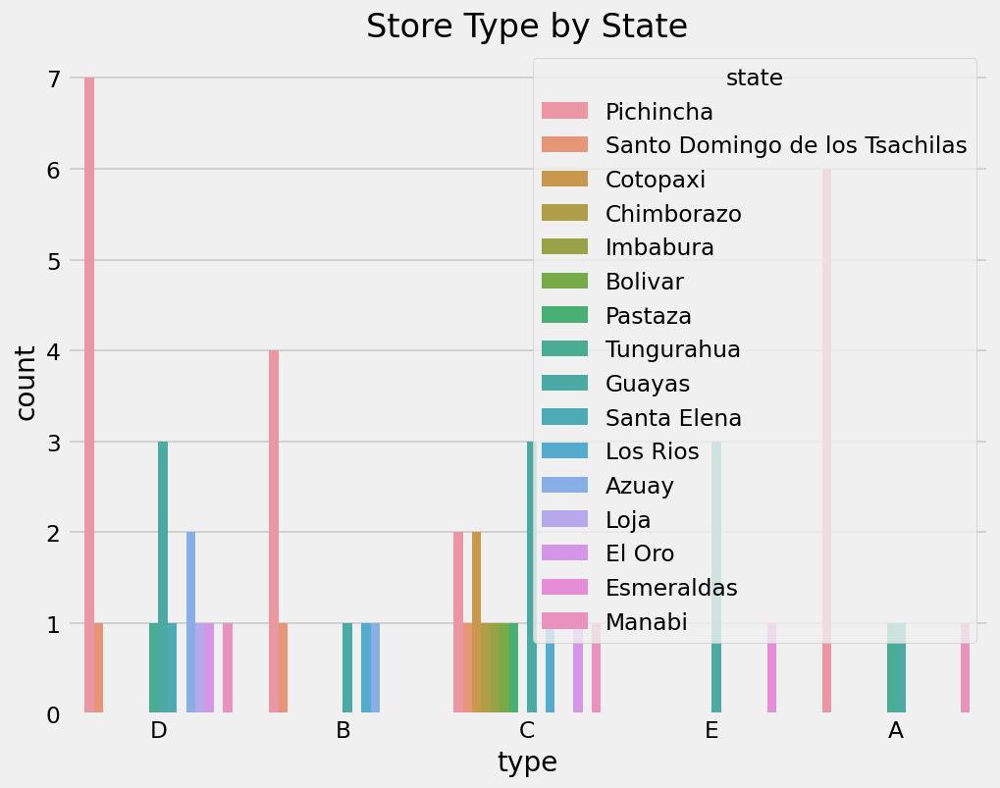

In [421]:
# Check the relationship between store type and state:
sns.countplot(data=stores, x='type', hue='state')
plt.title('Store Type by State')
plt.show()


### Holidays_Events Data

In [422]:
holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [423]:
# Checking holidays that were transferred

holidays[holidays.transferred == True]

,date,type,locale,locale_name,description,transferred
19,2012-10-09,Holiday,National,Ecuador,Independencia de Guayaquil,True
72,2013-10-09,Holiday,National,Ecuador,Independencia de Guayaquil,True
135,2014-10-09,Holiday,National,Ecuador,Independencia de Guayaquil,True
255,2016-05-24,Holiday,National,Ecuador,Batalla de Pichincha,True
266,2016-07-25,Holiday,Local,Guayaquil,Fundacion de Guayaquil,True
268,2016-08-10,Holiday,National,Ecuador,Primer Grito de Independencia,True
297,2017-01-01,Holiday,National,Ecuador,Primer dia del ano,True
303,2017-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,True
312,2017-05-24,Holiday,National,Ecuador,Batalla de Pichincha,True
324,2017-08-10,Holiday,National,Ecuador,Primer Grito de Independencia,True


These are the holidays that were transfered to other dates

In [424]:
# Count of the holidays transfered
holidays[holidays.transferred == True].value_counts().sum()

12

From the above, we can see that, there were 12 holidays transfered to other dates.

In [425]:
# Checking "Holidays" that were celebrated on actual days and not transferred

holidays[(holidays.type == "Holiday") & (holidays.transferred == False)]

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
6,2012-06-23,Holiday,Local,Guaranda,Cantonizacion de Guaranda,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
8,2012-06-25,Holiday,Local,Latacunga,Cantonizacion de Latacunga,False
9,2012-06-25,Holiday,Local,Machala,Fundacion de Machala,False


In [426]:
# Check the actual number of "Holidays" that were celebrated on actual days and not transferred

holidays[(holidays.type == "Holiday") & (holidays.transferred == False)].value_counts().sum()

209

From the above we can see that there were 209 holidays which were not transfered.

In [427]:
# Checking  Bridge holidays

holidays[holidays.type == "Bridge"].value_counts().sum()

5

There were five bridge holidays within the period

In [428]:
# Checking for Work days

holidays[holidays.type == "Work Day"].value_counts().sum()

5

There were 5 non-working days that observed as working days to pay back for the bridge.

In [429]:
# Checking additional holidays

holidays[holidays.type == "Additional"].value_counts().sum()

51

There were 51 additional days added to regular calendar holidays.

In [430]:
holidays[holidays.type == "Event"].value_counts().sum()

56

There were 56 days observed for special events

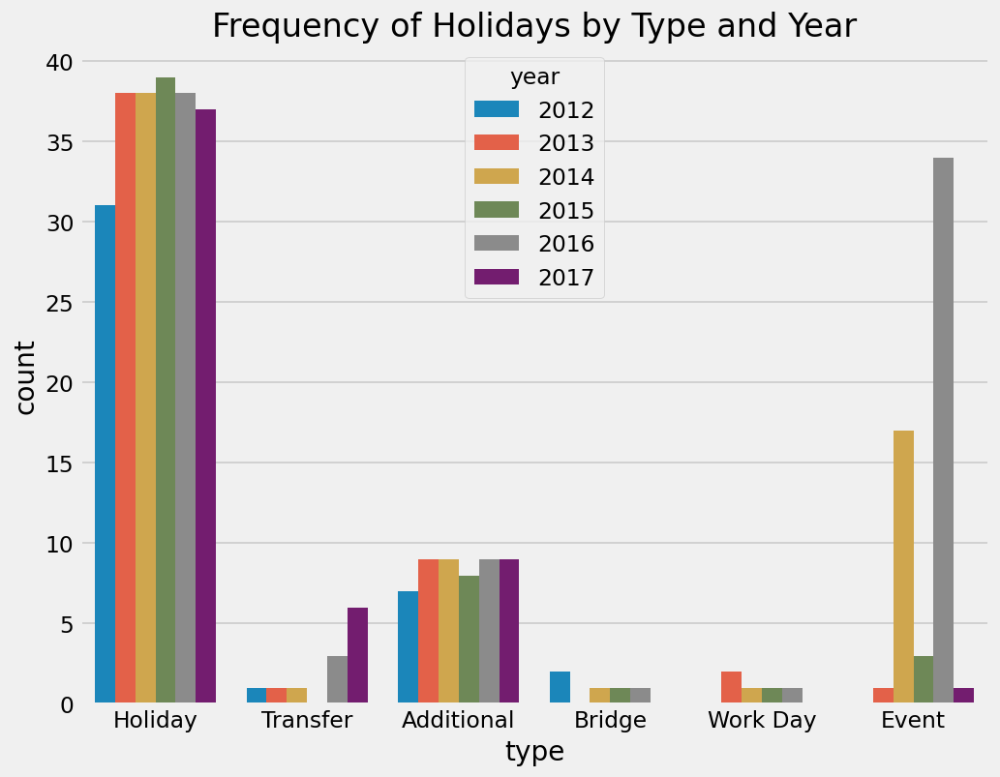

In [431]:
#Convert the date column to datetime format and extract the year:
holidays['year'] = pd.to_datetime(holidays['date']).dt.year

# Visualize the frequency of holidays by type and year:
sns.countplot(data=holidays, x='type', hue='year')
plt.title('Frequency of Holidays by Type and Year')
plt.show()


From the above we could see that 2015 experienced the highest holidays, with no holidays transfered, with less that 10 additional holidays, briges, work days and events. 2016 however exeperienced the highest events holiday types followed by the year 2014.

In [432]:
#Visualize the frequency of holidays by type and month:
#sns.countplot(data=holidays, x='type', hue='month')
#plt.title('Frequency of Holidays by Type and Month')
#plt.show()


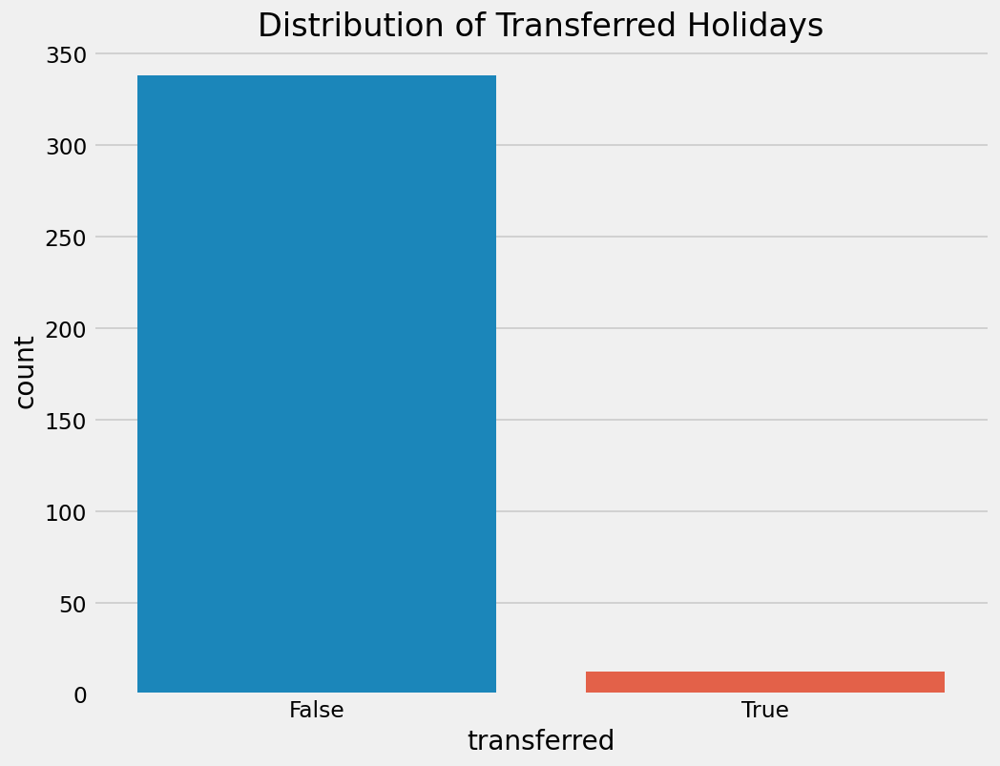

In [433]:
# Check the distribution of transferred holidays:
sns.countplot(data=holidays, x='transferred')
plt.title('Distribution of Transferred Holidays')
plt.show()


### Transactions Dataset

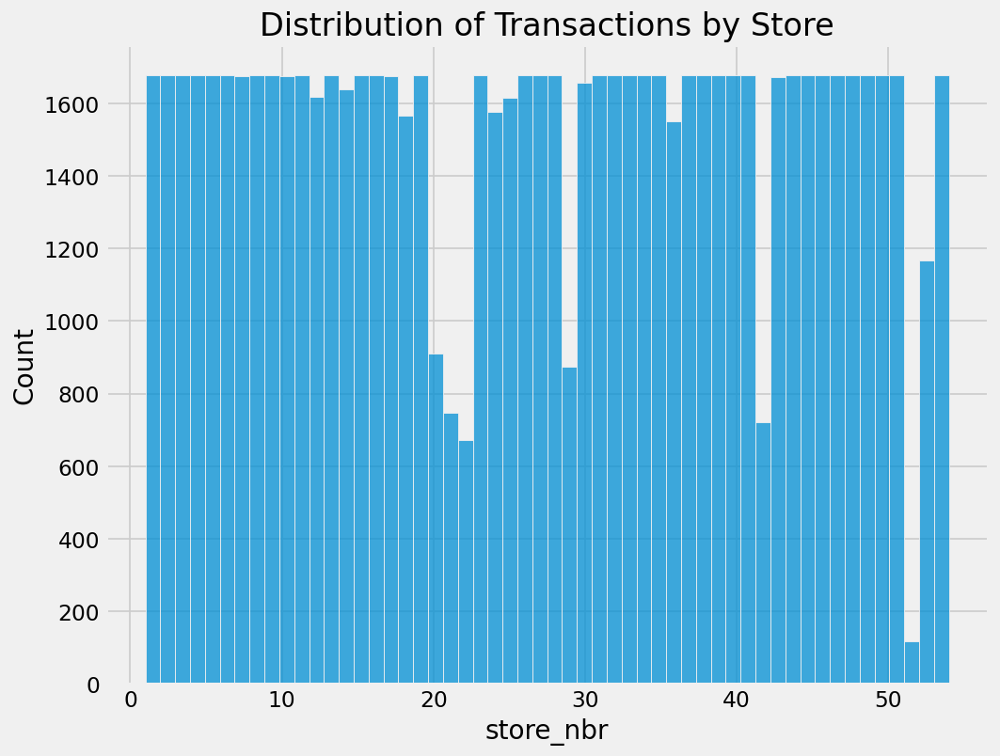

In [434]:
# Visualize the distribution of transactions by store:
sns.histplot(data=transactions, x='store_nbr', bins=54)
plt.title('Distribution of Transactions by Store')
plt.show()


### Train data

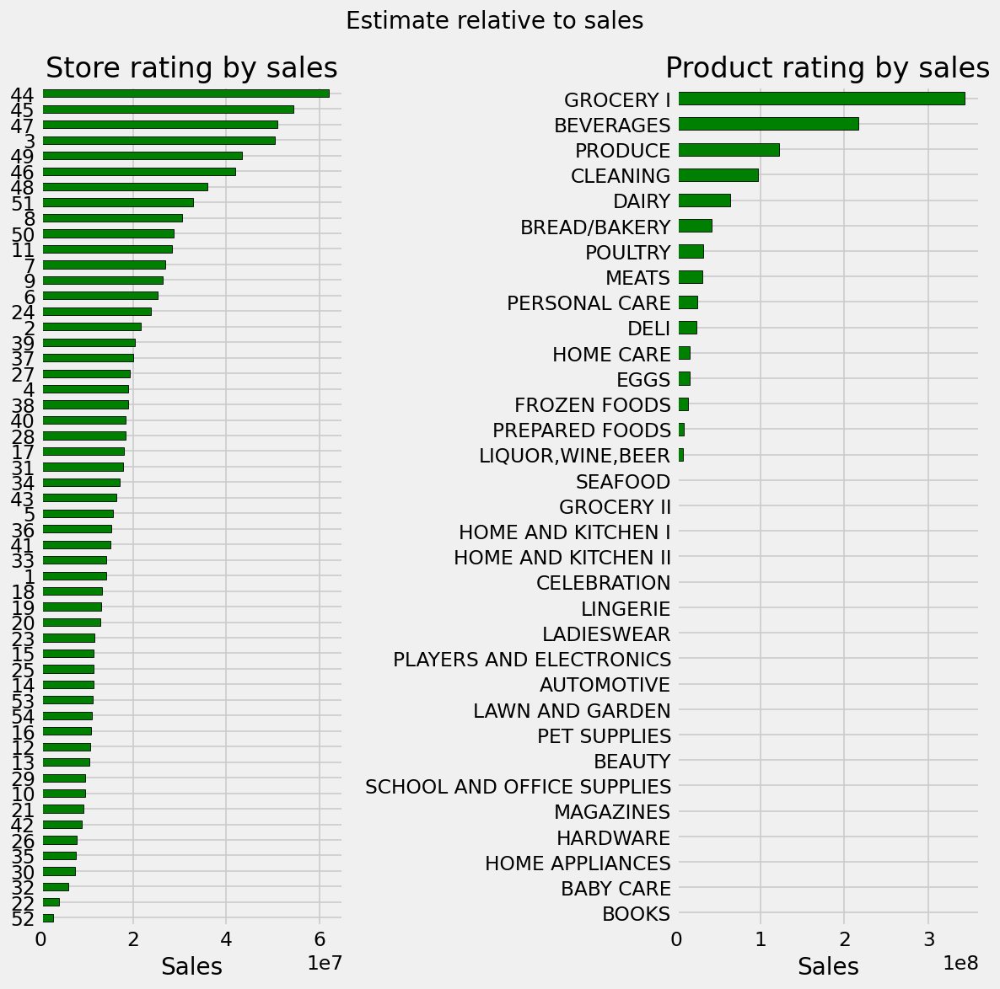

In [435]:
plt.subplot(1,2,1)
train.groupby('store_nbr')['sales'].sum().sort_values().plot(kind='barh', 
                                figsize=(10,10), edgecolor="k", color='green')
plt.ylabel('')
plt.yticks(rotation=0)
plt.xlabel('Sales')
plt.title('Store rating by sales')

plt.subplot(1,2,2)
train.groupby('family')['sales'].sum().sort_values().plot(kind='barh', 
                                figsize=(10,10), edgecolor="k", color='green')
plt.ylabel('')
plt.yticks(rotation=0)
plt.xlabel('Sales')
plt.title('Product rating by sales')

plt.suptitle('Estimate relative to sales')
plt.tight_layout()
plt.show()

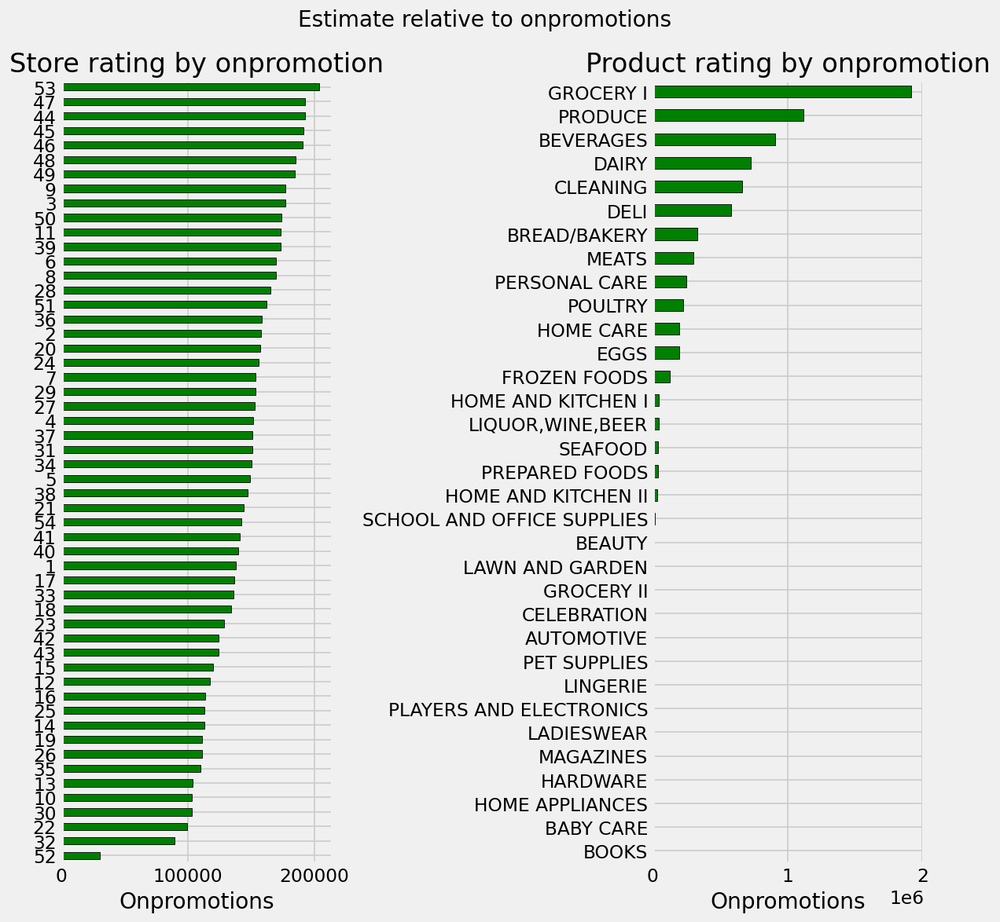

In [436]:
plt.subplot(1,2,1)
train.groupby('store_nbr')['onpromotion'].sum().sort_values().plot(kind='barh', 
                         figsize=(10,10), edgecolor="k", color='green')
plt.ylabel('')
plt.yticks(rotation=0)
plt.xlabel('Onpromotions')
plt.title('Store rating by onpromotion')

plt.subplot(1,2,2)
train.groupby('family')['onpromotion'].sum().sort_values().plot(kind='barh', 
                                figsize=(10,10), edgecolor="k", color='green')
plt.ylabel('')
plt.yticks(rotation=0)
plt.xlabel('Onpromotions')
plt.title('Product rating by onpromotion')

plt.suptitle('Estimate relative to onpromotions')
plt.tight_layout()
plt.show()

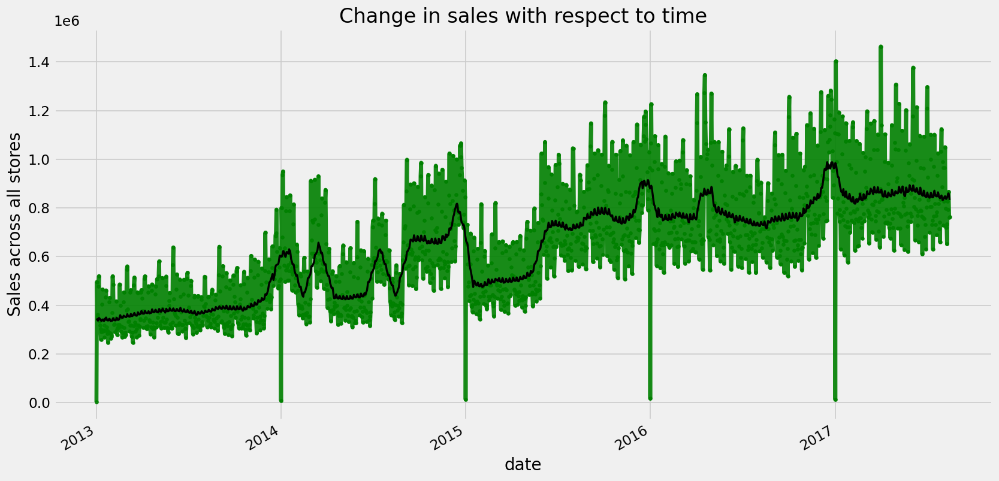

In [437]:
train.groupby('date')['sales'].sum().\
                plot(y="sales", marker=".", alpha=0.9, color='green', 
                figsize = (10,10));
train.groupby('date')['sales'].sum().\
        rolling(window=30, min_periods=7, center=True).mean().plot(lw=2, 
                                        color="k", figsize = (15,8));
plt.ylabel('Sales across all stores')
plt.xlabel('date')
plt.title('Change in sales with respect to time')
plt.show()

## Bivariate Analysis

In [438]:
#### Checking for the relationship between oil price and sales

sales = train.groupby("date").sales.sum()

In [439]:
oil_sales = pd.merge(sales, oil, on="date", how="left")
oil_sales = oil_sales.rename(columns={"dcoilwtico" : "oil_price"})
oil_sales = oil_sales.set_index("date").dropna()
oil_sales.head()

,sales,oil_price
date,,
2013-01-01,2511.618999,67.714366
2013-01-02,496092.417944,93.140000
2013-01-03,361461.231124,92.970000
2013-01-04,354459.677093,93.120000
2013-01-07,336122.801066,93.200000


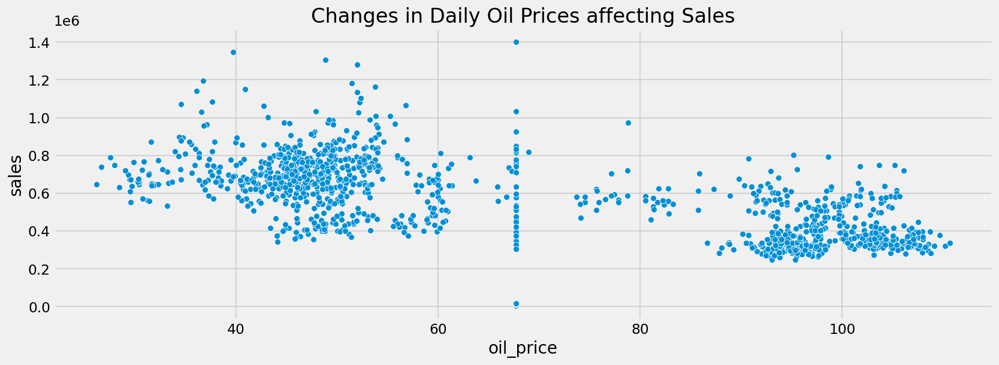

In [440]:
plt.figure(figsize=(15,5))
sns.scatterplot(data=oil_sales, x="oil_price", y="sales", palette="Blues_r", legend=False)
plt.title("Changes in Daily Oil Prices affecting Sales")
plt.show()


From the scatter plot one can see that the relationship between oil price and sales is negatively correlated. As oil prices increase, sales reduces.  The difference was however not so significant.


#### Transactions and Sales

In [441]:
Transactions = transactions.groupby("date").sum().drop("store_nbr", axis=1)
Transactions_Sales = pd.merge(Transactions, sales, on="date", how="left")
Transactions_Sales.head()

,transactions,sales
date,,
2013-01-01,770,2511.618999
2013-01-02,93215,496092.417944
2013-01-03,78504,361461.231124
2013-01-04,78494,354459.677093
2013-01-05,93573,477350.121229


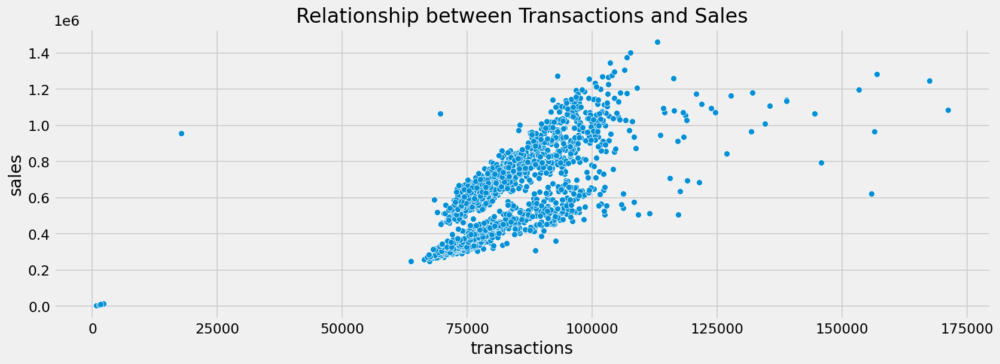

In [442]:
plt.figure(figsize=(15,5))
sns.scatterplot(data=Transactions_Sales, x="transactions", y="sales", palette="Blues_r", legend=False)
plt.title("Relationship between Transactions and Sales")
plt.show()


From the plot, sales and trasactions at different stores have a positive correlation. Generally, as transactions at the different stores increase, so does sales.

#### Transactions and oil

In [443]:
Oil_Transactions = pd.merge(Transactions, oil, on="date", how="left").dropna()
Oil_Transactions = Oil_Transactions.rename(columns={"dcoilwtico" : "oil_price"})
Oil_Transactions.head()

,date,transactions,oil_price
0,2013-01-01,770,67.714366
1,2013-01-02,93215,93.140000
2,2013-01-03,78504,92.970000
3,2013-01-04,78494,93.120000
6,2013-01-07,75597,93.200000


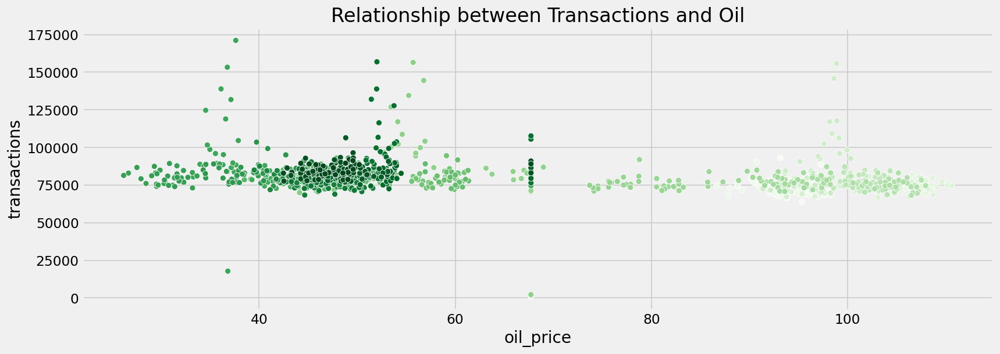

In [444]:
plt.figure(figsize=(15,5))
sns.scatterplot(data=Oil_Transactions, x="oil_price", y="transactions", palette="Greens", hue="date",
                legend=False)
plt.title("Relationship between Transactions and Oil")
plt.show()


The relationship between oil and transaction is stationary. A change in oil price does not necessarily calls for a change in transactions at the stores. However, there are some outlier values which may be caused other factors such as the holiday seasons 

## Answering Our Business Questions




### Question 1
Is the train dataset complete (has all the required dates)?

In [445]:
missing_date = pd.date_range(start="2013-01-01", end="2017-08-15").difference(train.date)
list(missing_date)

[Timestamp('2013-12-25 00:00:00'),
 Timestamp('2014-12-25 00:00:00'),
 Timestamp('2015-12-25 00:00:00'),
 Timestamp('2016-12-25 00:00:00')]

The train dataset did not include sales data for Christmas Day on December 25th for the years 2013 to 2016, which means that the dataset is incomplete for these dates. This could potentially impact the accuracy of any models that we build and predictions that we make for these missing dates.

We would therefor use time series interpolation techniques to estimate the missing values based on existing data. These techniques can help to fill in gaps and ensure that the dataset is complete without introducing potentially inaccurate data.

In [446]:
# delete later

# create a list of missing dates
#missing_dates = ['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25']

# iterate over each missing date and add a row to the DataFrame
#for date in missing_dates:
   # train.loc[date] = [0] * len(train.columns)


## Question 2. 

Which dates have the lowest and highest sales for each year?

<Axes: xlabel='year'>

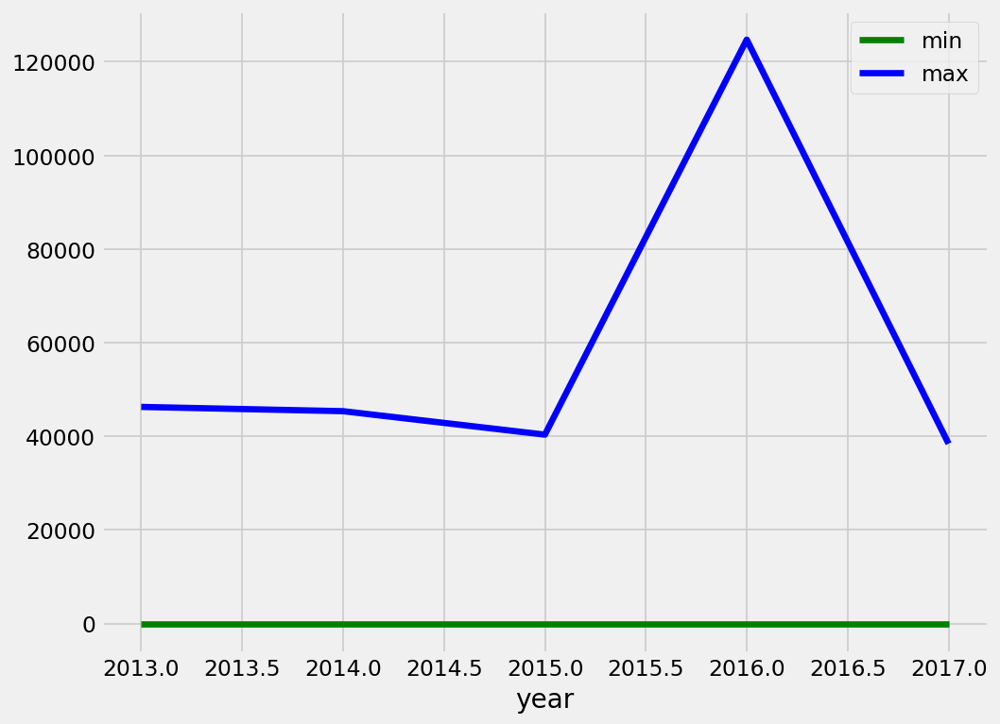

In [447]:
train['date'] = pd.to_datetime(train['date'])
train['year'] = train['date'].dt.year
sales_by_year = train.groupby('year')['sales'].agg(['min', 'max'])
sales_by_year.plot(kind='line', color=['green', 'blue'])
#sales_by_year.plot(kind='line', label=['Minimum sales', 'Maximum sales'])


From the line gragh above we can see that sales went up in the year 2013, with a little bit of drop towards the middle of the year and a further drop from the begining of 2014 to 2015. We recorded our least sales from the begining of 2015 and 2017.

We recorded our highest sales in 2016. This might be attributed to the earthquake in April 2016 since lots of people lost their items and government as well as benevolent organizations buying relieve items for affected families and individuals.

From the same grapgh one could also see that, the least sales always occured aroud January being the beggining of the year. 

## Question 3. 
Did the earthquake impact sales? (april 16, 2016) 

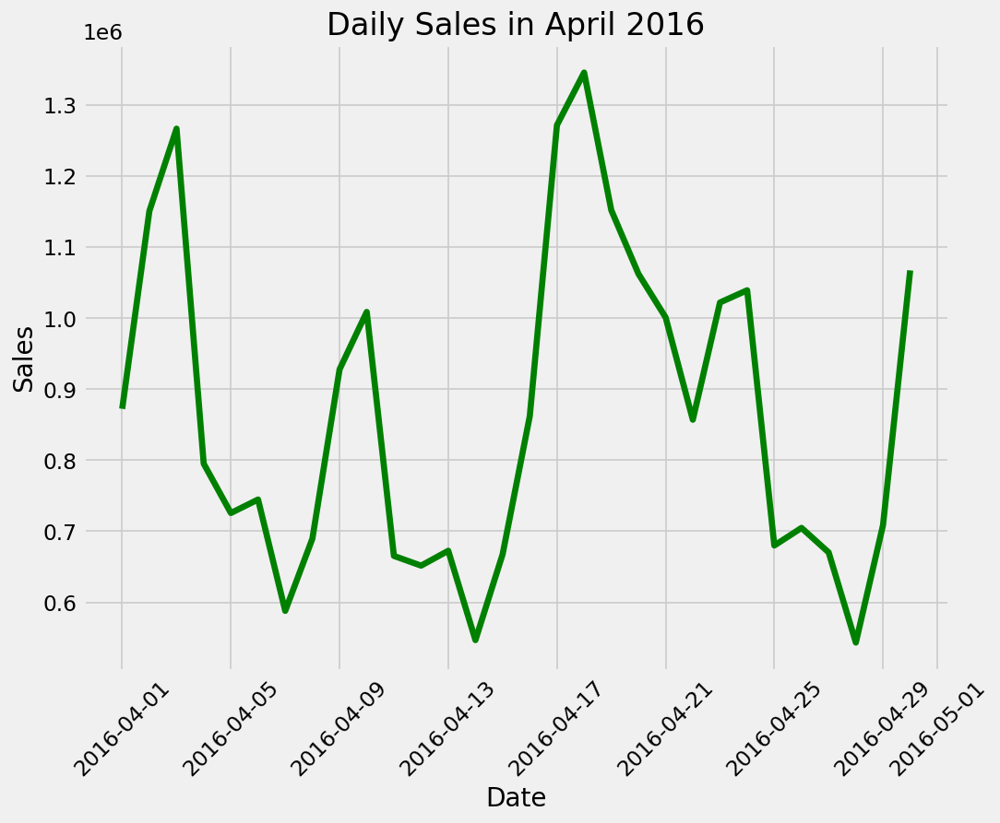

In [448]:
sales_df = pd.merge(train, transactions, on=['date', 'store_nbr'])
april_sales = sales_df[(sales_df['date'] >= '2016-04-01') & (sales_df['date'] <= '2016-04-30')]
daily_sales = april_sales.groupby('date')['sales'].sum()
plt.plot(daily_sales.index, daily_sales.values, color="green")
plt.title('Daily Sales in April 2016')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.xticks(rotation=45)
plt.show()


From the line grapgh above one can say yes, the earthquake impacted sales because the highest sales was recorded between 17th to somewhere around 20th of April 2016.

# Question 4. 
Are certain groups of stores selling more products? (Cluster, city, state, type)


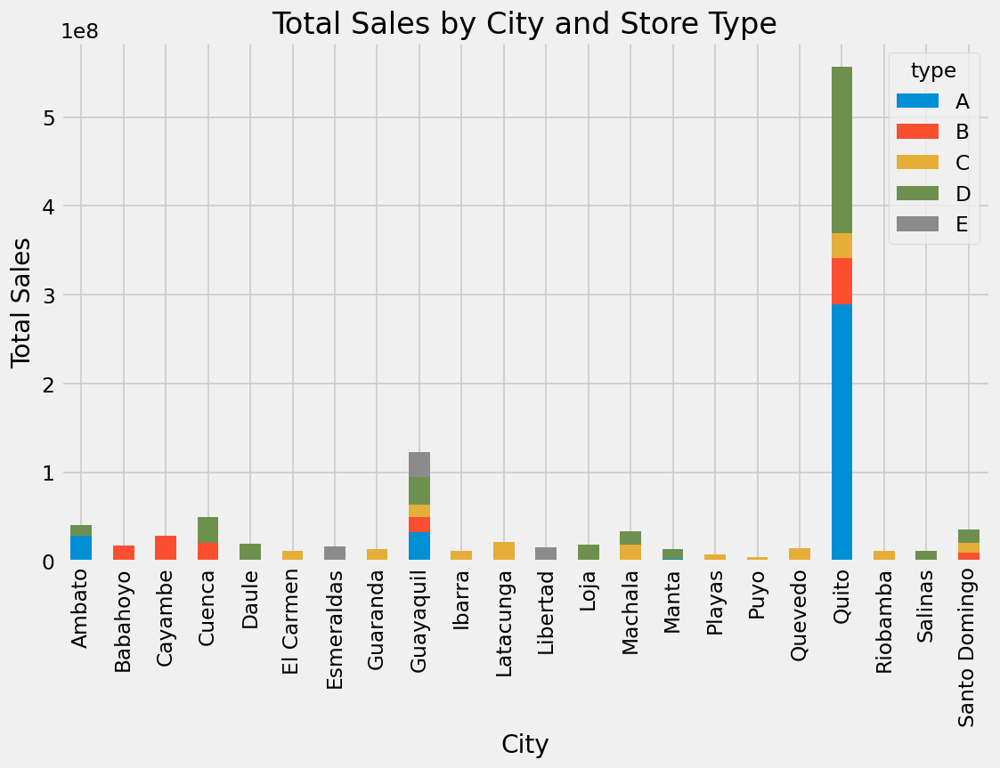

In [449]:
merged = pd.merge(train, stores, on="store_nbr")
grouped = merged.groupby(["city", "state", "type"])["sales"].sum().reset_index()
pivoted = grouped.pivot(index="city", columns="type", values="sales")
ax = pivoted.plot(kind="bar", stacked=True, figsize=(10, 6))
ax.set_xlabel("City")
ax.set_ylabel("Total Sales")
ax.set_title("Total Sales by City and Store Type")

plt.show()

From the above chart we can see that store a cluster of store types ABC&D seems to be doing so well in terms of sales in the City of Quito. With store type A making more and type C recording the lowest sales in the city. 

# Question 4. 
Are sales affected by promotions, oil prices and holidays?

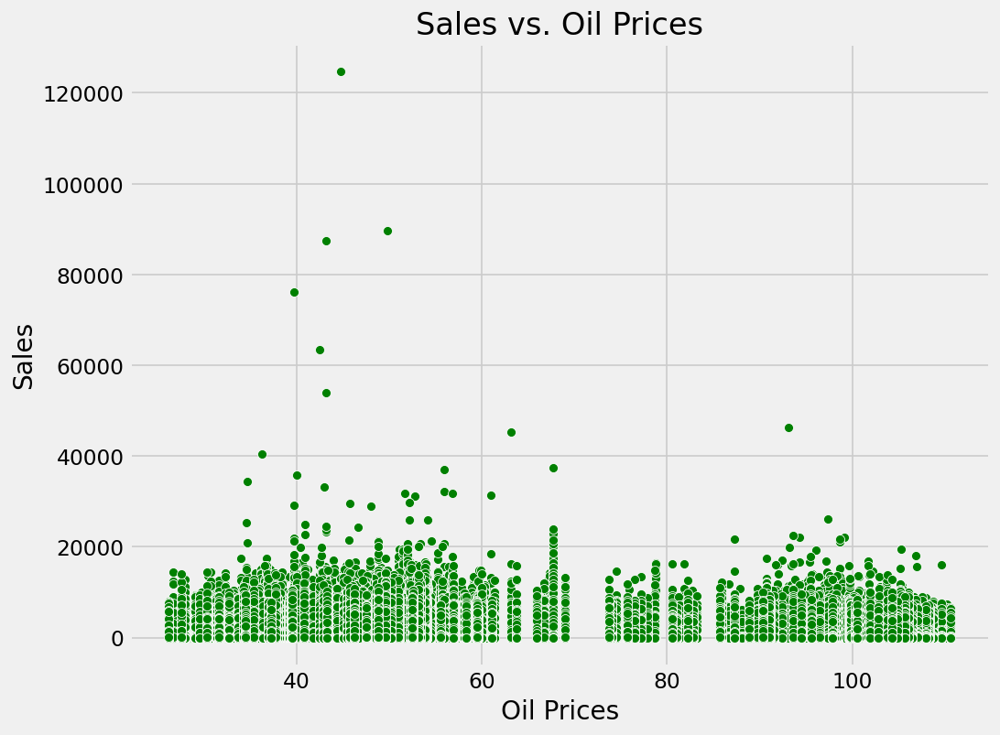

In [450]:
merged = pd.merge(train, oil, on="date", how="left")
sns.scatterplot(data=merged, x="dcoilwtico", y="sales", color='green')
plt.xlabel("Oil Prices")
plt.ylabel("Sales")
plt.title("Sales vs. Oil Prices")
plt.show()

In [451]:
#sns.barplot(data=merged, x="onpromotion", y="sales", color='green')
#plt.xlabel("On Promotion")
#plt.ylabel("Sales")
#plt.title("Sales by Promotion")
#plt.show()

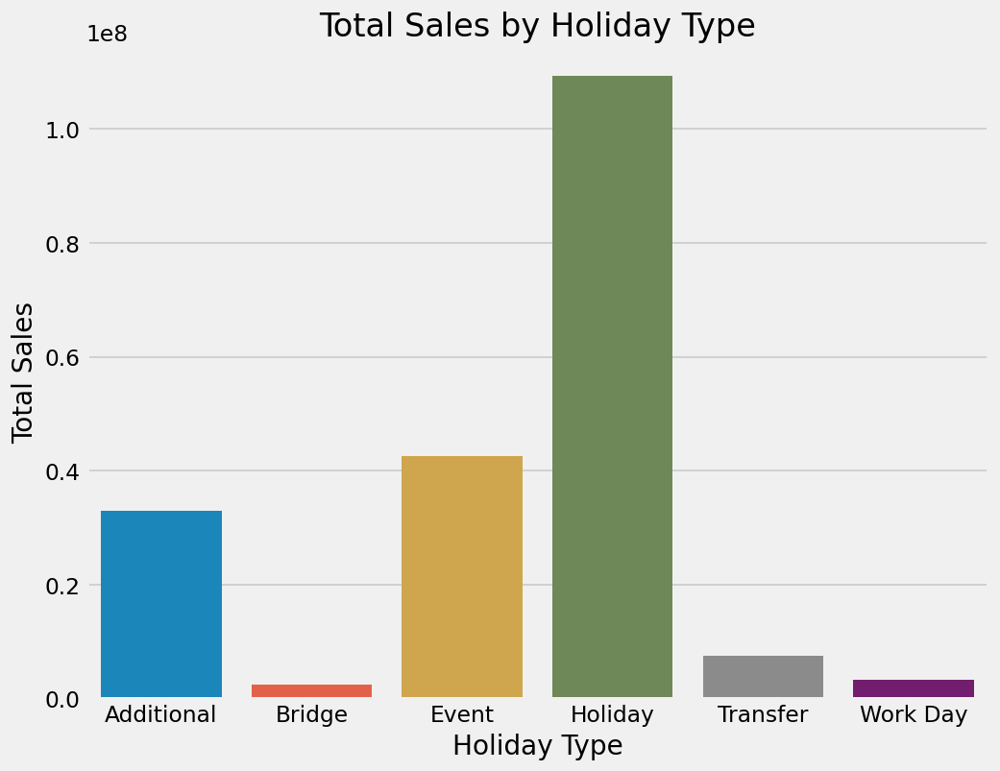

In [452]:
# Plot total sales by holiday type
merged = pd.merge(train, holidays, on="date", how="left")
grouped = merged.groupby("type")["sales"].sum().reset_index()
sns.barplot(data=grouped, x="type", y="sales")
plt.xlabel("Holiday Type")
plt.ylabel("Total Sales")
plt.title("Total Sales by Holiday Type")
plt.show()


## Question 5. 
What analysis can we get from the date and its extractable features?

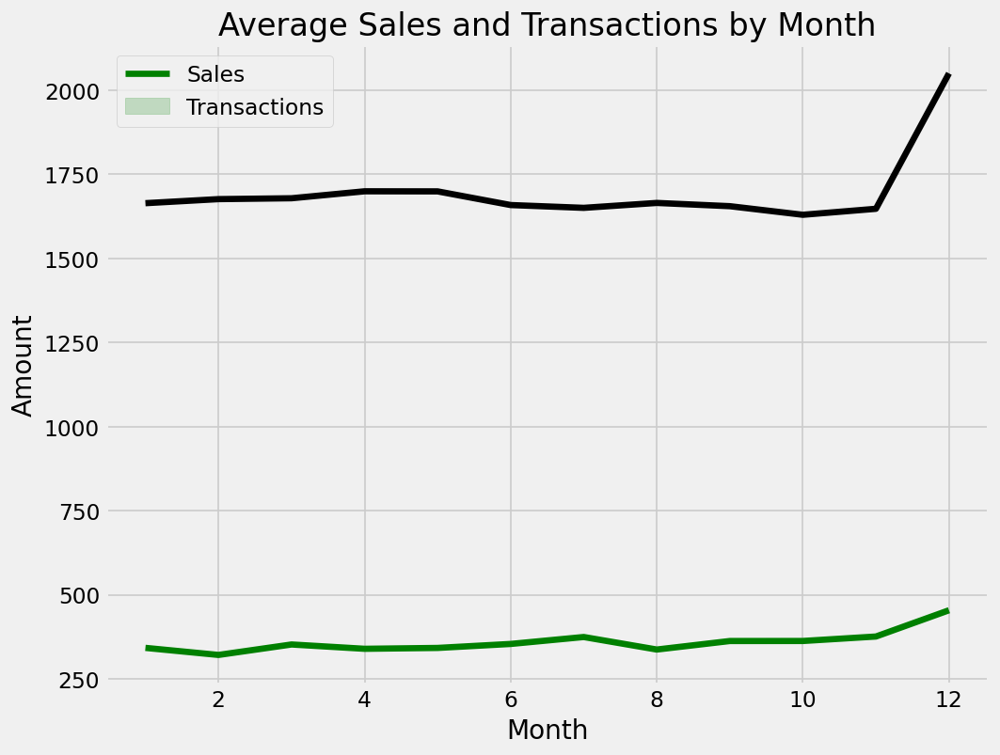

In [453]:
# Seasonality Analysis

train['month'] = train['date'].dt.month
transactions['month'] = transactions['date'].dt.month
sales_by_month = train.groupby('month')['sales'].mean().reset_index()
transactions_by_month = transactions.groupby('month')['transactions'].mean().reset_index()
sns.lineplot(x='month', y='sales', data=sales_by_month, color= 'green')
sns.lineplot(x='month', y='transactions', data=transactions_by_month, color='black')
plt.legend(['Sales', 'Transactions'])
plt.title('Average Sales and Transactions by Month')
plt.xlabel('Month')
plt.ylabel('Amount')
plt.show()

In [454]:

# Convert the date column to datetime format
train['date'] = pd.to_datetime(train['date'])

# Create a date range of all the dates in the dataset
start_date = train['date'].min()
end_date = train['date'].max()
date_range = pd.date_range(start=start_date, end=end_date)

# Get the actual dates in the dataset
actual_dates = train['date'].unique()

# Check for missing dates
missing_dates = date_range[~date_range.isin(actual_dates)]
print('Missing dates in the train dataset:', missing_dates)


Missing dates in the train dataset: DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25'], dtype='datetime64[ns]', freq=None)


6. What is the difference between RMSLE, RMSE, MSE (or why is the MAE greater than all of them?)

### Additional Questions 
7. Is there a significant difference in sales during holidays versus non-holidays?
8. Do stores located in certain locales have higher holiday sales compared to others?
9. Do stores in certain cities or states have higher sales compared to others?
10. Is there a difference in transactions during holidays versus non-holidays?
11. Does the promotion of certain items during holidays impact sales?

## FEATURE ENGINEERING

Create a new feature that indicates whether a given day is a holiday or not. This can be done using the isnull function to check if the type column in the holidays dataframe is null or not.

In [455]:

# Merge the DataFrames on specific columns
df = train.merge(stores, on='store_nbr').merge(transactions, on=['date', 'store_nbr']).merge(holidays, on='date').merge(oil, on='date')


In [456]:
df.head()

,id,date,store_nbr,family,sales,onpromotion,year_x,month_x,city,state,type_x,cluster,transactions,month_y,type_y,locale,locale_name,description,transferred,year_y,dcoilwtico
0,73062,2013-02-11,1,AUTOMOTIVE,0.0,0,2013,2,Quito,Pichincha,D,13,396,2,Holiday,National,Ecuador,Carnaval,False,2013,97.01
1,73063,2013-02-11,1,BABY CARE,0.0,0,2013,2,Quito,Pichincha,D,13,396,2,Holiday,National,Ecuador,Carnaval,False,2013,97.01
2,73064,2013-02-11,1,BEAUTY,0.0,0,2013,2,Quito,Pichincha,D,13,396,2,Holiday,National,Ecuador,Carnaval,False,2013,97.01
3,73065,2013-02-11,1,BEVERAGES,172.0,0,2013,2,Quito,Pichincha,D,13,396,2,Holiday,National,Ecuador,Carnaval,False,2013,97.01
4,73066,2013-02-11,1,BOOKS,0.0,0,2013,2,Quito,Pichincha,D,13,396,2,Holiday,National,Ecuador,Carnaval,False,2013,97.01


## Cleaning the merged data

In [457]:
# drop columns irrelevant to our model 
df = df.drop(['year_x', 'month_x', 'type_x', 'cluster', 'month_y', 'type_y', 'locale', 'locale_name', 'description', 'year_y'], axis=1)


In [458]:
df.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,transactions,transferred,dcoilwtico
0,73062,2013-02-11,1,AUTOMOTIVE,0.0,0,Quito,Pichincha,396,False,97.01
1,73063,2013-02-11,1,BABY CARE,0.0,0,Quito,Pichincha,396,False,97.01
2,73064,2013-02-11,1,BEAUTY,0.0,0,Quito,Pichincha,396,False,97.01
3,73065,2013-02-11,1,BEVERAGES,172.0,0,Quito,Pichincha,396,False,97.01
4,73066,2013-02-11,1,BOOKS,0.0,0,Quito,Pichincha,396,False,97.01


In [459]:
#checking the info of the merge dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 322047 entries, 0 to 322046
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            322047 non-null  int64         
 1   date          322047 non-null  datetime64[ns]
 2   store_nbr     322047 non-null  int64         
 3   family        322047 non-null  object        
 4   sales         322047 non-null  float64       
 5   onpromotion   322047 non-null  int64         
 6   city          322047 non-null  object        
 7   state         322047 non-null  object        
 8   transactions  322047 non-null  int64         
 9   transferred   322047 non-null  bool          
 10  dcoilwtico    322047 non-null  float64       
dtypes: bool(1), datetime64[ns](1), float64(2), int64(4), object(3)
memory usage: 27.3+ MB


In [460]:
df.isnull().any()

id              False
date            False
store_nbr       False
family          False
sales           False
onpromotion     False
city            False
state           False
transactions    False
transferred     False
dcoilwtico      False
dtype: bool

In [461]:
df.isna().any()

id              False
date            False
store_nbr       False
family          False
sales           False
onpromotion     False
city            False
state           False
transactions    False
transferred     False
dcoilwtico      False
dtype: bool

## Feature Creation

In [462]:

df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day
df['dayofweek'] = df['date'].dt.dayofweek  # Monday=0, Sunday=6
#df['weekofyear'] = df['date'].dt.w

In [463]:
#converting datetime values in the "date" column of a pandas DataFrame to Unix timestamps in float format.
df['date'] = df['date'].apply(lambda x: pd.Timestamp(x).timestamp()).astype(float)


### Splitting of the dataset 

In [464]:
X=df.iloc[:,0:12]
y=df.iloc[:,-1]

In [465]:


# X is our feature data and y is our target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [466]:
#setting date as index
X_train.set_index('date', inplace=True)
X_test.set_index('date', inplace=True)

### Linear Regression

In [468]:
# Convert categorical variables to one-hot encoded format
X_train = pd.get_dummies(X_train, columns=['product_type'])

# Fit linear regression model to training data
lr = LinearRegression()
lr.fit(X_train, y_train)

# Make predictions on test data
X_test = pd.get_dummies(X_test, columns=['product_type'])
y_pred = lr.predict(X_test)


KeyError: ignored

In [467]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit linear regression model to training data
lr = LinearRegression()
lr.fit(X_train, y_train)

# Make predictions on test data
y_pred = lr.predict(X_test)

# Evaluate model performance on test data
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmsle = np.sqrt(np.mean(np.square(np.log(y_pred + 1) - np.log(y_test + 1))))
print("RMSE:", rmse)
print("RMSLE:", rmsle)


ValueError: ignored